YAP 471 HW2

In this homework, we were supposed to work with DOW30 indexe's adjusted close variables from 2010 to 2021 and code some necessary functions to create intended portfolios. I also made calculations (annual return, standard deviation, max drawdown, sharpe ratio) for each stock. 

!pip3 install pygad
!pip install yahoofinancials
!pip install yfinance 
!pip install pyfolio 

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from datetime import datetime
import yfinance as yf
from yahoofinancials import YahooFinancials
import matplotlib.pyplot as plt
import seaborn as sn
import os
import random

In [2]:
#we use indexes function to get necessary adjclose variables using sorted dow30 indexes
indexes = []
#I also defined some arrays (in case array of arrays) to do not make calculations every time
annual_returns = []
std_deviations = []
sharpe_ratios = []
max_drawdowns = []
names = ["American Express Co - AXP", "Amgen Inc - AMGN", "Apple Inc - AAPL", "Boeing Co - BA", "Caterpillar Inc - CAT", "Cisco Systems Inc - CSCO", "Chevron Corp - CVX", "Goldman Sachs Group Inc - GS", "Home Depot Inc - HD", "Honeywell International Inc - HON", "International Business Machines Corp - IBM", "Intel Corp - INTC", "Johnson & Johnson - JNJ", "Coca-Cola Co - KO", "JPMorgan Chase & Co - JPM", "McDonald’s Corp - MCD", "3M Co - MMM", "Merck & Co Inc - MRK", "Microsoft Corp - MSFT", "Nike Inc - NKE", "Procter & Gamble Co - PG", "Travelers Companies Inc - TRV", "UnitedHealth Group Inc - UNH", "Salesforce Inc - CRM", "Verizon Communications Inc - VZ", "Visa Inc - V", "Walgreens Boots Alliance Inc - WBA", "Walmart Inc - WMT", "Walt Disney Co - DIS", "Down Jones Inc - DJI"]

Below functions take data for 12 years and return yearly computed values 

In [3]:
#www.reddit.com/r/learnpython/comments/bxyze5/getting_max_drawdown_with_python/
def maxDrawdown(df):
    df['year'] = pd.DatetimeIndex(df['Date']).year
    m = []
    for i in range(2010, 2022):
        a = df['adjclose'][df['year']==i]
        daily_returns = a.pct_change()
        total_return = daily_returns.cumsum()
        drawdown = total_return - total_return.cummax()
        m.append(drawdown.min())
    max_drawdowns.append(m)
    print("Max drawdown value successfully added to list. The size of the list is", len(max_drawdowns), "now.")

In [4]:
def sharpeRatioFunct(df):
    df['year'] = pd.DatetimeIndex(df['Date']).year
    m = []
    for i in range(2010, 2022):
        t = df['adjclose'][df['year']==i].pct_change(1)
        SharpeRatio = ( t.mean() / t.std() ) * np.sqrt(len(t))
        m.append(SharpeRatio)
    return m
    

In [5]:
def annualReturnF(df):
    df['year'] = pd.DatetimeIndex(df['Date']).year
    m = []
    for j in range(2010, 2022):
        a = df['adjclose'][df['year']== j] 
        a = a.values
        t = (a[len(a) - 1] - a[0]) / a[0]
        m.append(t)
    return m

In [6]:
def standartDeviationF(df):
    df['year'] = pd.DatetimeIndex(df['Date']).year
    m = []
    for j in range(2010, 2022):
        a = df['adjclose'][df['year']== j]
        a = a.values
        m.append(a.std())
        #a = df['adjclose'][df['year']== j].pct_change(1).std()
        #print("-------------------------", j, df['adjclose'][df['year']== j], a, "-------------------------")
        #m.append(a)
    return m

In [7]:
yahoo_financials = YahooFinancials('AXP')
axp = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
axp = pd.DataFrame(axp['AXP']['prices'])
axp['formatted_date'] =  pd.to_datetime(axp['formatted_date'], infer_datetime_format=True)
#rename formatted_date to date and set Date index to dataframe
axp = axp.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(axp)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(axp)

# Compute the yearly returns
yearly_returns = annualReturnF(axp)

# Compute the standart deviation
std_dev = standartDeviationF(axp)

axp = axp.drop('date', axis=1).set_index('Date')
indexes.append(axp)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

# add arrays to the necessary lists for further computations
# I did not use frames bc it is easy to reach values by using indexes of lists (for ex: std_deviations list) 
# rather than using the phase frameAXP['Std Dev']
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

print("\n Dataframe Entries: ")
axp.head()


Max drawdown value successfully added to list. The size of the list is 1 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.067831   2.072877     -0.226966      0.364986
2011       0.104227   2.298720     -0.213391      0.478868
2012       0.204689   2.477358     -0.130945      1.032822
2013       0.558364   7.100487     -0.083213      2.592370
2014       0.051461   2.786225     -0.168079      0.371518
2015      -0.241932   3.848760     -0.266951     -1.189507
2016       0.117309   4.992807     -0.248958      0.578241
2017       0.339205   6.947155     -0.075819      2.308011
2018      -0.022560   5.058188     -0.227727      0.025707
2019       0.320188   7.746777     -0.124813      1.716948
2020      -0.025479  14.916871     -0.614890      0.271968
2021       0.406928  17.060062     -0.214024      1.368027

 Dataframe Entries: 


,high,low,open,close,volume,adjclose,year
Date,,,,,,,
2010-01-04,41.099998,40.389999,40.810001,40.919998,6894300,33.921700,2010
2010-01-05,41.230000,40.369999,40.830002,40.830002,10641200,33.847092,2010
2010-01-06,41.669998,41.169998,41.230000,41.490002,8399400,34.394207,2010
2010-01-07,42.240002,41.110001,41.259998,41.980000,8981700,34.952045,2010
2010-01-08,42.480000,41.400002,41.759998,41.950001,7907700,34.927082,2010


In [8]:
yahoo_financials = YahooFinancials('AMGN')
amgn = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
amgn = pd.DataFrame(amgn['AMGN']['prices'])
amgn['formatted_date'] =  pd.to_datetime(amgn['formatted_date'], infer_datetime_format=True)
amgn = amgn.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(amgn)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(amgn)

# Compute the yearly returns
yearly_returns = annualReturnF(amgn)

# Compute the standart deviation
std_dev = standartDeviationF(amgn)

amgn = amgn.drop('date', axis=1).set_index('Date')
indexes.append(amgn)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#amgn.head()

Max drawdown value successfully added to list. The size of the list is 2 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010      -0.048857   1.782457     -0.189824     -0.112278
2011       0.167906   2.177927     -0.231758      0.827834
2012       0.370442   6.795557     -0.060934      1.870215
2013       0.303361   8.355636     -0.169941      1.122155
2014       0.402192  14.477369     -0.134066      1.501554
2015       0.035654   5.674178     -0.272900      0.264930
2016      -0.052265   8.691987     -0.254413     -0.098610
2017       0.186017   8.852710     -0.165862      1.071461
2018       0.132149  10.161025     -0.159934      0.643761
2019       0.294430  18.513783     -0.181542      1.343457
2020      -0.015930  14.719593     -0.257908      0.147562
2021       0.030072  14.055293     -0.228347      0.249539


In [9]:
yahoo_financials = YahooFinancials('AAPL')
aapl = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
aapl = pd.DataFrame(aapl['AAPL']['prices'])
aapl['formatted_date'] =  pd.to_datetime(aapl['formatted_date'], infer_datetime_format=True)
aapl = aapl.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(aapl)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(aapl)

# Compute the yearly returns
yearly_returns = annualReturnF(aapl)

# Compute the standart deviation
std_dev = standartDeviationF(aapl)

aapl = aapl.drop('date', axis=1).set_index('Date')
indexes.append(aapl)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#aapl.head()

Max drawdown value successfully added to list. The size of the list is 3 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.507220   1.144560     -0.134754      1.672471
2011       0.228874   0.790048     -0.144577      0.919917
2012       0.305586   2.055754     -0.301105      1.056923
2013       0.047509   1.472592     -0.301506      0.307846
2014       0.426284   3.108499     -0.107111      1.756060
2015      -0.020823   1.692486     -0.237148      0.054493
2016       0.123843   1.881443     -0.206031      0.618065
2017       0.480425   3.610772     -0.090574      2.326304
2018      -0.070544   5.043964     -0.435864     -0.112971
2019       0.887424   8.628112     -0.192616      2.569699
2020       0.782399  21.716886     -0.335346      1.474745
2021       0.385508  14.615861     -0.199441      1.434288


In [10]:
yahoo_financials = YahooFinancials('BA')
ba = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
ba = pd.DataFrame(ba['BA']['prices'])
ba['formatted_date'] =  pd.to_datetime(ba['formatted_date'], infer_datetime_format=True)
ba = ba.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(ba)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(ba)

# Compute the yearly returns
yearly_returns = annualReturnF(ba)

# Compute the standart deviation
std_dev = standartDeviationF(ba)

ba = ba.drop('date', axis=1).set_index('Date')
indexes.append(ba)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#ba.head()

Max drawdown value successfully added to list. The size of the list is 4 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.190656   3.271192     -0.213218      0.736319
2011       0.131701   4.075634     -0.305093      0.560249
2012       0.039844   1.605443     -0.130551      0.303595
2013       0.806243  17.138557     -0.061001      2.924087
2014      -0.026749   4.170848     -0.170702     -0.045108
2015       0.140914   6.199229     -0.210099      0.715594
2016       0.145490   9.992144     -0.241747      0.690977
2017       0.931149  40.562714     -0.045335      3.855990
2018       0.107767  17.145007     -0.267268      0.484026
2019       0.029202  23.020537     -0.286361      0.244499
2020      -0.353973  63.756127     -1.174256     -0.061910
2021      -0.000049  17.010818     -0.322127      0.175672


In [11]:
yahoo_financials = YahooFinancials('CAT')
cat = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
cat = pd.DataFrame(cat['CAT']['prices'])
cat['formatted_date'] =  pd.to_datetime(cat['formatted_date'], infer_datetime_format=True)
cat = cat.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(cat)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(cat)

# Compute the yearly returns
yearly_returns = annualReturnF(cat)

# Compute the standart deviation
std_dev = standartDeviationF(cat)

cat = cat.drop('date', axis=1).set_index('Date')
indexes.append(cat)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#cat.head()

Max drawdown value successfully added to list. The size of the list is 5 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.640398   8.133673     -0.235348      1.727360
2011      -0.019657   7.145957     -0.449922      0.133635
2012      -0.020586   7.889786     -0.356298      0.048493
2013      -0.008824   3.129475     -0.202743      0.036351
2014       0.045588   4.893596     -0.195967      0.323403
2015      -0.232671   5.281103     -0.316088     -0.914477
2016       0.420432   8.783063     -0.134152      1.442444
2017       0.727058  16.406543     -0.077706      2.799964
2018      -0.172746  10.920452     -0.364757     -0.420434
2019       0.201661   8.190299     -0.215602      0.819415
2020       0.245620  22.130975     -0.447166      0.716851
2021       0.155010  14.623261     -0.241834      0.692609


In [12]:
yahoo_financials = YahooFinancials('CSCO')
csco = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
csco = pd.DataFrame(csco['CSCO']['prices'])
csco['formatted_date'] =  pd.to_datetime(csco['formatted_date'], infer_datetime_format=True)
csco = csco.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(csco)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(csco)

# Compute the yearly returns
yearly_returns = annualReturnF(csco)

# Compute the standart deviation
std_dev = standartDeviationF(csco)

csco = csco.drop('date', axis=1).set_index('Date')
indexes.append(csco)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#csco.head()

Max drawdown value successfully added to list. The size of the list is 6 now.

       Annual Return   Std Dev  Max Drawdown  Sharpe Ratio
Date                                                     
2010      -0.180640  1.576418     -0.325562     -0.488161
2011      -0.107640  1.266855     -0.440034     -0.149305
2012       0.079512  1.062591     -0.313195      0.427648
2013       0.127669  1.390882     -0.244396      0.607097
2014       0.294883  1.485348     -0.119066      1.628915
2015       0.006924  0.861343     -0.180074      0.144905
2016       0.174878  2.108178     -0.149840      0.858375
2017       0.298928  1.955800     -0.108957      1.755582
2018       0.148917  2.218933     -0.186645      0.659294
2019       0.148196  3.918382     -0.264439      0.690691
2020      -0.051010  3.348071     -0.389635      0.084625
2021       0.477678  4.614829     -0.100506      2.139969


In [13]:
yahoo_financials = YahooFinancials('CVX')
cvx = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
cvx = pd.DataFrame(cvx['CVX']['prices'])
cvx['formatted_date'] =  pd.to_datetime(cvx['formatted_date'], infer_datetime_format=True)
cvx = cvx.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(cvx)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(cvx)

# Compute the yearly returns
yearly_returns = annualReturnF(cvx)

# Compute the standart deviation
std_dev = standartDeviationF(cvx)

cvx = cvx.drop('date', axis=1).set_index('Date')
indexes.append(cvx)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#cvx.head()

Max drawdown value successfully added to list. The size of the list is 7 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.197270   3.628300     -0.190712      0.976797
2011       0.193773   3.365939     -0.187392      0.781102
2012       0.012824   3.462491     -0.137407      0.160420
2013       0.168768   3.011485     -0.085783      1.266507
2014      -0.064119   4.845706     -0.263759     -0.276396
2015      -0.164685   7.183395     -0.441280     -0.521486
2016       0.383687   7.648157     -0.122128      1.500064
2017       0.104489   5.108397     -0.110027      0.779222
2018      -0.114382   4.820248     -0.215657     -0.384726
2019       0.132950   3.581769     -0.110179      0.774020
2020      -0.265131  11.072596     -0.711960     -0.195140
2021       0.458918   8.504135     -0.137552      1.668067


In [14]:
yahoo_financials = YahooFinancials('GS')
gs = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
gs = pd.DataFrame(gs['GS']['prices'])
gs['formatted_date'] =  pd.to_datetime(gs['formatted_date'], infer_datetime_format=True)
gs = gs.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(gs)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(gs)

# Compute the yearly returns
yearly_returns = annualReturnF(gs)

# Compute the standart deviation
std_dev = standartDeviationF(gs)

gs = gs.drop('date', axis=1).set_index('Date')
indexes.append(gs)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#gs.head()

Max drawdown value successfully added to list. The size of the list is 8 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010      -0.019206  10.265947     -0.317102      0.092419
2011      -0.471350  22.309474     -0.619166     -1.497329
2012       0.359788   9.251615     -0.329307      1.240553
2013       0.364092   8.629790     -0.126481      1.567785
2014       0.110171  10.407675     -0.152338      0.691677
2015      -0.060707   9.848997     -0.227578     -0.169876
2016       0.372767  23.150830     -0.204236      1.320114
2017       0.067886  10.852128     -0.170113      0.433536
2018      -0.337619  22.111873     -0.523546     -1.482356
2019       0.364124  12.451128     -0.124285      1.442298
2020       0.152532  25.256445     -0.547188      0.532720
2021       0.480331  38.589418     -0.125502      1.686957


In [15]:
yahoo_financials = YahooFinancials('HD')
hd = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
hd = pd.DataFrame(hd['HD']['prices'])
hd['formatted_date'] =  pd.to_datetime(hd['formatted_date'], infer_datetime_format=True)
hd = hd.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(hd)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(hd)

# Compute the yearly returns
yearly_returns = annualReturnF(hd)

# Compute the standart deviation
std_dev = standartDeviationF(hd)

hd = hd.drop('date', axis=1).set_index('Date')
indexes.append(hd)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#hd.head()

Max drawdown value successfully added to list. The size of the list is 9 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.260870   1.919293     -0.280946      1.115680
2011       0.226218   1.877666     -0.273116      0.911828
2012       0.499844   5.241748     -0.112880      2.273128
2013       0.324069   4.250935     -0.094903      1.723947
2014       0.307455   7.221583     -0.088970      1.699439
2015       0.304376   7.086663     -0.099861      1.421979
2016       0.044736   4.990777     -0.148105      0.328253
2017       0.443652  12.095464     -0.092079      2.880315
2018      -0.065560  10.786098     -0.286626     -0.187511
2019       0.301130  18.413568     -0.110356      1.543515
2020       0.237762  30.183888     -0.424239      0.714348
2021       0.585723  41.136998     -0.124308      2.408227


In [16]:
yahoo_financials = YahooFinancials('HON')
hon = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
hon = pd.DataFrame(hon['HON']['prices'])
hon['formatted_date'] =  pd.to_datetime(hon['formatted_date'], infer_datetime_format=True)
hon = hon.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(hon)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(hon)

# Compute the yearly returns
yearly_returns = annualReturnF(hon)

# Compute the standart deviation
std_dev = standartDeviationF(hon)

hon = hon.drop('date', axis=1).set_index('Date')
indexes.append(hon)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#hon.head()

Max drawdown value successfully added to list. The size of the list is 10 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.354821   3.042022     -0.212686      1.327679
2011       0.028556   3.667477     -0.356926      0.249988
2012       0.172193   2.036848     -0.141727      0.887129
2013       0.441196   5.699003     -0.063053      2.326869
2014       0.128452   2.644397     -0.126519      0.836635
2015       0.054746   2.418827     -0.147769      0.367072
2016       0.160628   5.089742     -0.110042      0.931296
2017       0.347159   9.576582     -0.037672      3.005877
2018      -0.084751   6.353129     -0.244576     -0.363990
2019       0.369958  11.462562     -0.121667      1.909607
2020       0.203948  23.961329     -0.522788      0.636206
2021       0.012979   9.914088     -0.150696      0.162770


In [17]:
yahoo_financials = YahooFinancials('IBM')
ibm = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
ibm = pd.DataFrame(ibm['IBM']['prices'])
ibm['formatted_date'] =  pd.to_datetime(ibm['formatted_date'], infer_datetime_format=True)
ibm = ibm.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(ibm)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(ibm)

# Compute the yearly returns
yearly_returns = annualReturnF(ibm)

# Compute the standart deviation
std_dev = standartDeviationF(ibm)

ibm = ibm.drop('date', axis=1).set_index('Date')
indexes.append(ibm)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

print("\n Dataframe Entries: ")
ibm[ibm['year'] == 2015]

Max drawdown value successfully added to list. The size of the list is 11 now.

       Annual Return   Std Dev  Max Drawdown  Sharpe Ratio
Date                                                     
2010       0.129241  4.922111     -0.090522      0.775187
2011       0.267899  7.361420     -0.151558      1.175240
2012       0.045489  4.694177     -0.126322      0.358116
2013      -0.026179  6.909129     -0.199573     -0.049800
2014      -0.114237  7.383608     -0.238914     -0.622900
2015      -0.123078  7.436519     -0.247635     -0.516103
2016       0.267489  9.582830     -0.128049      1.304139
2017      -0.046770  8.134472     -0.239525     -0.229674
2018      -0.229747  9.576088     -0.379657     -0.940733
2019       0.219242  5.473864     -0.139862      1.069644
2020      -0.021698  8.590474     -0.463233      0.151939
2021       0.187004  8.424070     -0.186619      0.869827

 Dataframe Entries: 


,high,low,open,close,volume,adjclose,year
Date,,,,,,,
2015-01-02,156.128113,153.919693,154.216064,154.933075,5779673,112.178085,2015
2015-01-05,154.177826,152.189301,154.177826,152.495224,5104898,110.412979,2015
2015-01-06,152.925430,148.346085,152.648178,149.206497,6429448,108.031807,2015
2015-01-07,150.286804,147.256210,150.286804,148.231354,4918083,107.325752,2015
2015-01-08,152.045883,148.709366,149.369019,151.453156,4431693,109.658501,2015
...,...,...,...,...,...,...,...
2015-12-24,132.772461,132.036331,132.342255,132.170166,1563979,98.821762,2015
2015-12-28,131.969406,130.535370,131.682602,131.558319,3287996,98.364296,2015
2015-12-29,133.900574,132.122375,132.170166,133.632889,4125110,99.915436,2015


In [18]:
yahoo_financials = YahooFinancials('INTC')
intc = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
intc = pd.DataFrame(intc['INTC']['prices'])
intc['formatted_date'] =  pd.to_datetime(intc['formatted_date'], infer_datetime_format=True)
intc = intc.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(intc)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(intc)

# Compute the yearly returns
yearly_returns = annualReturnF(intc)

# Compute the standart deviation
std_dev = standartDeviationF(intc)

intc = intc.drop('date', axis=1).set_index('Date')
indexes.append(intc)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#intc.head()

Max drawdown value successfully added to list. The size of the list is 12 now.

       Annual Return   Std Dev  Max Drawdown  Sharpe Ratio
Date                                                     
2010       0.038266  0.900728     -0.282763      0.274983
2011       0.204271  1.198964     -0.199139      0.818550
2012      -0.130544  1.828035     -0.368372     -0.557521
2013       0.262662  1.197625     -0.136779      1.250958
2014       0.451746  3.744436     -0.131637      1.794368
2015      -0.024022  1.946962     -0.314334      0.021824
2016       0.102282  2.435513     -0.164097      0.548585
2017       0.296902  3.493428     -0.107869      1.608518
2018       0.026915  3.001743     -0.275057      0.247182
2019       0.302955  4.198625     -0.287384      1.116613
2020      -0.160769  5.788492     -0.377635     -0.058260
2021       0.068685  4.116371     -0.321221      0.370761


In [19]:
yahoo_financials = YahooFinancials('JNJ')
jnj = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
jnj = pd.DataFrame(jnj['JNJ']['prices'])
jnj['formatted_date'] =  pd.to_datetime(jnj['formatted_date'], infer_datetime_format=True)
jnj = jnj.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(jnj)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(jnj)

# Compute the yearly returns
yearly_returns = annualReturnF(jnj)

# Compute the standart deviation
std_dev = standartDeviationF(jnj)

jnj = jnj.drop('date', axis=1).set_index('Date')
indexes.append(jnj)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("Dataframe Entries: ")
#jnj.head()

Max drawdown value successfully added to list. The size of the list is 13 now.

       Annual Return   Std Dev  Max Drawdown  Sharpe Ratio
Date                                                     
2010      -0.010019  1.619188     -0.133659     -0.014814
2011       0.081927  2.014391     -0.118857      0.543099
2012       0.103426  2.349682     -0.058752      1.074792
2013       0.332181  5.729918     -0.088602      2.353894
2014       0.180591  4.986527     -0.113543      1.216485
2015       0.011906  2.463019     -0.130123      0.153986
2016       0.179002  6.502330     -0.105666      1.307242
2017       0.237486  7.962068     -0.059981      1.928778
2018      -0.047976  7.246960     -0.191919     -0.114141
2019       0.174027  4.723821     -0.118540      1.062198
2020       0.107478  6.665704     -0.297108      0.488112
2021       0.128770  5.207839     -0.125570      0.911689


In [20]:
yahoo_financials = YahooFinancials('KO')
ko = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
ko = pd.DataFrame(ko['KO']['prices'])
ko['formatted_date'] =  pd.to_datetime(ko['formatted_date'], infer_datetime_format=True)
ko = ko.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(ko)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(ko)

# Compute the yearly returns
yearly_returns = annualReturnF(ko)

# Compute the standart deviation
std_dev = standartDeviationF(ko)

ko = ko.drop('date', axis=1).set_index('Date')
indexes.append(ko)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("Dataframe Entries: ")
#ko.head()

Max drawdown value successfully added to list. The size of the list is 14 now.

       Annual Return   Std Dev  Max Drawdown  Sharpe Ratio
Date                                                     
2010       0.189366  1.597181     -0.118173      1.196695
2011       0.103817  0.893711     -0.091532      0.654046
2012       0.062694  1.375677     -0.109574      0.537426
2013       0.130239  1.210409     -0.132439      0.876236
2014       0.069489  1.616419     -0.103528      0.526395
2015       0.053394  1.116881     -0.119933      0.434654
2016       0.009589  1.228126     -0.123335      0.138667
2017       0.134517  1.852627     -0.042141      1.450444
2018       0.075707  2.141633     -0.141937      0.564233
2019       0.216787  3.345173     -0.103939      1.244384
2020       0.031400  4.236238     -0.437283      0.263863
2021       0.149225  2.834413     -0.082575      1.021013


In [21]:
yahoo_financials = YahooFinancials('JPM')
jpm = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
jpm = pd.DataFrame(jpm['JPM']['prices'])
jpm['formatted_date'] =  pd.to_datetime(jpm['formatted_date'], infer_datetime_format=True)
jpm = jpm.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(jpm)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(jpm)

# Compute the yearly returns
yearly_returns = annualReturnF(jpm)

# Compute the standart deviation
std_dev = standartDeviationF(jpm)

jpm = jpm.drop('date', axis=1).set_index('Date')
indexes.append(jpm)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("Dataframe Entries: ")
#jpm.head()

Max drawdown value successfully added to list. The size of the list is 15 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010      -0.006292   1.833711     -0.271072      0.132067
2011      -0.220496   4.067369     -0.464583     -0.416194
2012       0.294456   2.754897     -0.381271      1.060967
2013       0.337023   2.863343     -0.116168      1.625847
2014       0.096752   1.962645     -0.126906      0.608043
2015       0.078349   3.229559     -0.153780      0.451192
2016       0.387023   6.964912     -0.176892      1.462610
2017       0.253928   5.911522     -0.121112      1.482856
2018      -0.074974   4.107646     -0.238692     -0.243728
2019       0.447511  10.249897     -0.106195      2.080770
2020      -0.066663  14.620323     -0.499289      0.143522
2021       0.290695   9.978301     -0.116706      1.305196


In [22]:
yahoo_financials = YahooFinancials('MCD')
mcd = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
mcd = pd.DataFrame(mcd['MCD']['prices'])
mcd['formatted_date'] =  pd.to_datetime(mcd['formatted_date'], infer_datetime_format=True)
mcd = mcd.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(mcd)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(mcd)

# Compute the yearly returns
yearly_returns = annualReturnF(mcd)

# Compute the standart deviation
std_dev = standartDeviationF(mcd)

mcd = mcd.drop('date', axis=1).set_index('Date')
indexes.append(mcd)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("Dataframe Entries: ")
#mcd.head()

Max drawdown value successfully added to list. The size of the list is 16 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.262552   4.140252     -0.078029      1.613280
2011       0.349420   6.032564     -0.074625      1.873021
2012      -0.078918   3.150626     -0.159659     -0.522943
2013       0.111873   2.257981     -0.085128      0.962016
2014       0.005410   2.534981     -0.127461      0.105781
2015       0.310444   7.066687     -0.101351      1.506644
2016       0.067119   3.901085     -0.153901      0.504846
2017       0.475967  15.571526     -0.050966      3.081226
2018       0.051074   8.752897     -0.174092      0.344101
2019       0.149490  12.465346     -0.149569      1.007571
2020       0.095341  18.363171     -0.421004      0.427256
2021       0.300200  15.897566     -0.053309      1.812477


In [23]:
yahoo_financials = YahooFinancials('MMM')
mmm = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
mmm = pd.DataFrame(mmm['MMM']['prices'])
mmm['formatted_date'] =  pd.to_datetime(mmm['formatted_date'], infer_datetime_format=True)
mmm = mmm.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(mmm)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(mmm)

# Compute the yearly returns
yearly_returns = annualReturnF(mmm)

# Compute the standart deviation
std_dev = standartDeviationF(mmm)

mmm = mmm.drop('date', axis=1).set_index('Date')
indexes.append(mmm)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("Dataframe Entries: ")
#mmm.head()

Max drawdown value successfully added to list. The size of the list is 17 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.066174   2.573429     -0.172941      0.415536
2011      -0.033851   4.835767     -0.298907      0.016507
2012       0.142075   2.632700     -0.086212      1.012554
2013       0.513041   8.440022     -0.053315      3.137425
2014       0.218454   8.105919     -0.109486      1.392477
2015      -0.057624   5.946370     -0.194071     -0.229383
2016       0.248836   9.495388     -0.094343      1.602607
2017       0.352977  16.569302     -0.067813      2.463644
2018      -0.169943  13.648880     -0.317391     -0.662583
2019      -0.044963  15.239114     -0.338570     -0.056340
2020       0.007213  12.092411     -0.392445      0.206184
2021       0.066379  10.594702     -0.169416      0.440443


In [24]:
yahoo_financials = YahooFinancials('MRK')
mrk = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
mrk = pd.DataFrame(mrk['MRK']['prices'])
mrk['formatted_date'] =  pd.to_datetime(mrk['formatted_date'], infer_datetime_format=True)
mrk = mrk.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(mrk)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(mrk)

# Compute the yearly returns
yearly_returns = annualReturnF(mrk)

# Compute the standart deviation
std_dev = standartDeviationF(mrk)

mrk = mrk.drop('date', axis=1).set_index('Date')
indexes.append(mrk)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#mrk.head()

Max drawdown value successfully added to list. The size of the list is 18 now.

       Annual Return   Std Dev  Max Drawdown  Sharpe Ratio
Date                                                     
2010       0.016050  0.942441     -0.234212      0.180128
2011       0.095601  1.268304     -0.214089      0.520452
2012       0.113641  2.408986     -0.153053      0.776780
2013       0.255996  1.938175     -0.077124      1.482584
2014       0.182550  2.086164     -0.125278      0.975656
2015      -0.045602  2.290276     -0.223573     -0.105083
2016       0.157996  3.863153     -0.089215      0.803928
2017      -0.035828  2.516396     -0.196417     -0.156999
2018       0.400783  6.582918     -0.141569      1.796406
2019       0.235978  4.001654     -0.127803      1.249027
2020      -0.083037  3.617648     -0.292660     -0.113258
2021       0.034814  4.102394     -0.216592      0.264019


In [25]:
yahoo_financials = YahooFinancials('MSFT')
msft = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
msft = pd.DataFrame(msft['MSFT']['prices'])
msft['formatted_date'] =  pd.to_datetime(msft['formatted_date'], infer_datetime_format=True)
msft = msft.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(msft)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(msft)

# Compute the yearly returns
yearly_returns = annualReturnF(msft)

# Compute the standart deviation
std_dev = standartDeviationF(msft)

msft = msft.drop('date', axis=1).set_index('Date')
indexes.append(msft)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("Dataframe Entries: ")
#msft.head()

Max drawdown value successfully added to list. The size of the list is 19 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010      -0.079442   1.651480     -0.296746     -0.269085
2011      -0.047545   0.885572     -0.178792     -0.091039
2012       0.025976   1.214625     -0.182946      0.227130
2013       0.395438   3.105491     -0.137002      1.476162
2014       0.284228   3.648956     -0.103864      1.414477
2015       0.218785   4.079660     -0.173504      0.842798
2016       0.165057   3.838099     -0.139323      0.789088
2017       0.397411   6.971558     -0.060648      2.345960
2018       0.202191   7.942794     -0.185067      0.794983
2019       0.582593  14.937767     -0.079646      2.421969
2020       0.399429  23.029131     -0.287487      0.986767
2021       0.571796  37.087837     -0.090363      2.274738


In [26]:
yahoo_financials = YahooFinancials('NKE')
nke = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
nke = pd.DataFrame(nke['NKE']['prices'])
nke['formatted_date'] =  pd.to_datetime(nke['formatted_date'], infer_datetime_format=True)
nke = nke.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(nke)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(nke)

# Compute the yearly returns
yearly_returns = annualReturnF(nke)

# Compute the standart deviation
std_dev = standartDeviationF(nke)

nke = nke.drop('date', axis=1).set_index('Date')
indexes.append(nke)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#nke.head()

Max drawdown value successfully added to list. The size of the list is 20 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.326869   1.596913     -0.137206      1.363731
2011       0.135908   1.293934     -0.170001      0.570094
2012       0.081710   1.362595     -0.251890      0.458281
2013       0.537843   3.814984     -0.089859      2.221455
2014       0.243875   3.915349     -0.115115      1.134412
2015       0.329360   6.165778     -0.117991      1.373094
2016      -0.163896   3.338973     -0.250199     -0.691680
2017       0.219410   3.101082     -0.161517      1.022616
2018       0.180935   5.923014     -0.221784      0.713804
2019       0.382432   5.689638     -0.139999      1.672165
2020       0.397438  18.413907     -0.476657      1.014290
2021       0.204493  15.145668     -0.174102      0.802870


In [27]:
yahoo_financials = YahooFinancials('PG')
pg = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
pg = pd.DataFrame(pg['PG']['prices'])
pg['formatted_date'] =  pd.to_datetime(pg['formatted_date'], infer_datetime_format=True)
pg = pg.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(pg)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(pg)

# Compute the yearly returns
yearly_returns = annualReturnF(pg)

# Compute the standart deviation
std_dev = standartDeviationF(pg)

pg = pg.drop('date', axis=1).set_index('Date')
indexes.append(pg)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#pg.head()

Max drawdown value successfully added to list. The size of the list is 21 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.084872   1.137319     -0.072589      0.678169
2011       0.063362   1.344798     -0.131817      0.485217
2012       0.050147   2.201183     -0.124944      0.439486
2013       0.209735   3.012216     -0.082615      1.279787
2014       0.166707   3.669890     -0.064550      1.381268
2015      -0.093225   3.818589     -0.272379     -0.532227
2016       0.108115   3.043839     -0.084771      0.796539
2017       0.125347   2.403386     -0.083704      1.153987
2018       0.049748   6.044054     -0.244334      0.347642
2019       0.406800  10.276542     -0.062121      2.160822
2020       0.155308  10.870461     -0.231319      0.606707
2021       0.210739   8.628293     -0.129412      1.405701


In [28]:
yahoo_financials = YahooFinancials('TRV')
trv = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
trv = pd.DataFrame(trv['TRV']['prices'])
trv['formatted_date'] =  pd.to_datetime(trv['formatted_date'], infer_datetime_format=True)
trv = trv.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(trv)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(trv)

# Compute the yearly returns
yearly_returns = annualReturnF(trv)

# Compute the standart deviation
std_dev = standartDeviationF(trv)

trv = trv.drop('date', axis=1).set_index('Date')
indexes.append(trv)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("Dataframe Entries: ")
#trv.head()

Max drawdown value successfully added to list. The size of the list is 22 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.149538   1.945002     -0.128123      0.846310
2011       0.090946   3.071672     -0.278761      0.455556
2012       0.252322   4.167967     -0.082682      1.466159
2013       0.272438   3.362856     -0.113094      1.696999
2014       0.212318   6.145004     -0.104066      1.697323
2015       0.095199   4.404554     -0.122269      0.602475
2016       0.138873   4.361467     -0.122319      0.860697
2017       0.147834   5.378684     -0.118588      1.140414
2018      -0.071388   5.494333     -0.245750     -0.268243
2019       0.193769   8.811015     -0.169490      1.161562
2020       0.048796  13.665961     -0.476772      0.349110
2021       0.182147   6.165377     -0.106710      0.889184


In [29]:
yahoo_financials = YahooFinancials('UNH')
unh = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
unh = pd.DataFrame(unh['UNH']['prices'])
unh['formatted_date'] =  pd.to_datetime(unh['formatted_date'], infer_datetime_format=True)
unh = unh.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(unh)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(unh)

# Compute the yearly returns
yearly_returns = annualReturnF(unh)

# Compute the standart deviation
std_dev = standartDeviationF(unh)

unh = unh.drop('date', axis=1).set_index('Date')
indexes.append(unh)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#unh.head()

Max drawdown value successfully added to list. The size of the list is 23 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.159174   2.090395     -0.210974      0.708337
2011       0.382829   3.073538     -0.230213      1.204240
2012       0.068941   1.842516     -0.161179      0.423281
2013       0.402673   6.591557     -0.113975      1.737566
2014       0.377919   7.718975     -0.091902      1.806585
2015       0.186351   4.740990     -0.130805      0.801913
2016       0.398106  12.347708     -0.067356      1.866826
2017       0.386138  18.670889     -0.049524      2.371490
2018       0.141615  16.746712     -0.203566      0.690991
2019       0.227778  17.549832     -0.210626      0.942672
2020       0.218637  29.007657     -0.389641      0.653720
2021       0.463584  42.704203     -0.116413      2.092314


In [30]:
yahoo_financials = YahooFinancials('CRM')
crm = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
crm = pd.DataFrame(crm['CRM']['prices'])
crm['formatted_date'] =  pd.to_datetime(crm['formatted_date'], infer_datetime_format=True)
crm = crm.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(crm)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(crm)

# Compute the yearly returns
yearly_returns = annualReturnF(crm)

# Compute the standart deviation
std_dev = standartDeviationF(crm)

crm = crm.drop('date', axis=1).set_index('Date')
indexes.append(crm)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#crm.head()

Max drawdown value successfully added to list. The size of the list is 24 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.764234   5.620474     -0.202881      1.492061
2011      -0.257247   3.095466     -0.415386     -0.419783
2012       0.661067   3.804878     -0.243455      1.615224
2013       0.289712   5.393321     -0.237867      0.975834
2014       0.081116   3.540368     -0.284005      0.398848
2015       0.323430   6.351352     -0.142269      1.043423
2016      -0.107548   5.465593     -0.336172     -0.172113
2017       0.449249   8.589252     -0.084477      2.453036
2018       0.311847  14.252363     -0.263502      0.970806
2019       0.199852   6.482173     -0.161257      0.840937
2020       0.332595  37.653268     -0.410812      0.801904
2021       0.158958  26.671302     -0.212806      0.667549


In [31]:
yahoo_financials = YahooFinancials('VZ')
vz = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
vz = pd.DataFrame(vz['VZ']['prices'])
vz['formatted_date'] =  pd.to_datetime(vz['formatted_date'], infer_datetime_format=True)
vz = vz.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(vz)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(vz)

# Compute the yearly returns
yearly_returns = annualReturnF(vz)

# Compute the standart deviation
std_dev = standartDeviationF(vz)

vz = vz.drop('date', axis=1).set_index('Date')
indexes.append(vz)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#vz.head()

Max drawdown value successfully added to list. The size of the list is 25 now.

       Annual Return   Std Dev  Max Drawdown  Sharpe Ratio
Date                                                     
2010       0.220063  1.776319     -0.178404      1.330109
2011       0.160832  0.845031     -0.126844      0.872603
2012       0.142872  2.045145     -0.126157      1.019513
2013       0.159238  1.923516     -0.143833      0.952386
2014      -0.002634  1.217863     -0.123832      0.055983
2015       0.032226  1.070820     -0.147923      0.280082
2016       0.216205  2.049203     -0.181991      1.310004
2017       0.016895  2.004816     -0.201376      0.183012
2018       0.100107  3.462590     -0.163424      0.572877
2019       0.142429  2.109778     -0.100041      0.922008
2020       0.004416  2.452563     -0.180405      0.139947
2021      -0.071908  1.648823     -0.152498     -0.453448


In [32]:
yahoo_financials = YahooFinancials('V')
v = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
v = pd.DataFrame(v['V']['prices'])
v['formatted_date'] =  pd.to_datetime(v['formatted_date'], infer_datetime_format=True)
v = v.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(v)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(v)

# Compute the yearly returns
yearly_returns = annualReturnF(v)

# Compute the standart deviation
std_dev = standartDeviationF(v)

v = v.drop('date', axis=1).set_index('Date')
indexes.append(v)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#v.head()

Max drawdown value successfully added to list. The size of the list is 26 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010      -0.196168   1.741975     -0.355213     -0.509665
2011       0.451194   2.061292     -0.124744      1.333489
2012       0.483339   3.176921     -0.090376      2.002419
2013       0.444356   4.040546     -0.111208      1.843343
2014       0.195323   4.096738     -0.162068      0.945926
2015       0.178697   4.746599     -0.127601      0.856662
2016       0.038485   3.631143     -0.111542      0.283711
2017       0.444366   9.493428     -0.052348      2.931571
2018       0.159891   9.353883     -0.198144      0.714620
2019       0.422703  15.180691     -0.088020      2.052908
2020       0.151509  15.436659     -0.413957      0.543692
2021       0.006651  12.790476     -0.261704      0.148650


In [33]:
yahoo_financials = YahooFinancials('WBA')
wba = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
wba = pd.DataFrame(wba['WBA']['prices'])
wba['formatted_date'] =  pd.to_datetime(wba['formatted_date'], infer_datetime_format=True)
wba = wba.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(wba)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(wba)

# Compute the yearly returns
yearly_returns = annualReturnF(wba)

# Compute the standart deviation
std_dev = standartDeviationF(wba)

wba = wba.drop('date', axis=1).set_index('Date')
indexes.append(wba)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#wba.head()

Max drawdown value successfully added to list. The size of the list is 27 now.

       Annual Return   Std Dev  Max Drawdown  Sharpe Ratio
Date                                                     
2010       0.064760  2.494742     -0.345318      0.366141
2011      -0.141398  2.953927     -0.352048     -0.430480
2012       0.152734  1.628429     -0.202546      0.729724
2013       0.545557  5.233178     -0.140034      2.099540
2014       0.372718  4.223154     -0.234832      1.256868
2015       0.139150  4.386554     -0.171978      0.613665
2016       0.015022  2.250049     -0.121588      0.175594
2017      -0.107271  4.541464     -0.285916     -0.528036
2018      -0.066457  5.456617     -0.267181     -0.113241
2019      -0.106126  5.715800     -0.385734     -0.274738
2020      -0.295170  4.727448     -0.447019     -0.479988
2021       0.303757  2.722833     -0.211836      1.105186


In [34]:
yahoo_financials = YahooFinancials('WMT')
wmt = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
wmt = pd.DataFrame(wmt['WMT']['prices'])
wmt['formatted_date'] =  pd.to_datetime(wmt['formatted_date'], infer_datetime_format=True)
wmt = wmt.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(wmt)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(wmt)

# Compute the yearly returns
yearly_returns = annualReturnF(wmt)

# Compute the standart deviation
std_dev = standartDeviationF(wmt)

wmt = wmt.drop('date', axis=1).set_index('Date')
indexes.append(wmt)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#wmt.head()

Max drawdown value successfully added to list. The size of the list is 28 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.017349   1.327245     -0.144454      0.193569
2011       0.125303   1.963833     -0.145762      0.796839
2012       0.158836   5.137243     -0.124415      0.991391
2013       0.164401   2.889337     -0.096365      1.312715
2014       0.115589   3.076022     -0.078470      0.890551
2015      -0.266537   7.851356     -0.434510     -1.396785
2016       0.157292   2.978760     -0.095142      0.855074
2017       0.475426   8.653379     -0.089626      2.236488
2018      -0.032752   6.106387     -0.259013     -0.019300
2019       0.298980   9.055385     -0.082532      1.896504
2020       0.232187  12.239927     -0.135455      0.818359
2021      -0.007393   5.203599     -0.151016      0.038701


In [35]:
yahoo_financials = YahooFinancials('DIS')
dis = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
dis = pd.DataFrame(dis['DIS']['prices'])
dis['formatted_date'] =  pd.to_datetime(dis['formatted_date'], infer_datetime_format=True)
dis = dis.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(dis)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(dis)

# Compute the yearly returns
yearly_returns = annualReturnF(dis)

# Compute the standart deviation
std_dev = standartDeviationF(dis)

dis = dis.drop('date', axis=1).set_index('Date')
indexes.append(dis)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#dis.head()

Max drawdown value successfully added to list. The size of the list is 29 now.

       Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2010       0.182423   1.887281     -0.169082      0.835472
2011       0.008189   3.448958     -0.392243      0.180850
2012       0.319619   3.703669     -0.115181      1.646129
2013       0.513565   5.327578     -0.103330      2.430588
2014       0.250651   5.376974     -0.104511      1.355338
2015       0.134599   6.496110     -0.235640      0.674137
2016       0.027249   3.624637     -0.149187      0.243636
2017       0.029233   4.467232     -0.164652      0.267241
2018      -0.003678   5.748597     -0.156639      0.085178
2019       0.343467  12.883535     -0.127784      1.422702
2020       0.222537  19.071319     -0.492367      0.652924
2021      -0.122411  11.686165     -0.333014     -0.405005


In [36]:
yahoo_financials = YahooFinancials('DD')
dupont = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
                                                  end_date='2021-12-31', 
                                                  time_interval='daily')
dupont = pd.DataFrame(dupont['DD']['prices'])
dupont['formatted_date'] =  pd.to_datetime(dupont['formatted_date'], infer_datetime_format=True)
dupont = dupont.rename(columns = {'formatted_date':'Date'})

# Compute the max drawdown value and add it to the global list 
maxDrawdown(dupont)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(dupont)

# Compute the yearly returns
yearly_returns = annualReturnF(dupont)

# Compute the standart deviation
std_dev = standartDeviationF(dupont)

dupont = dupont.drop('date', axis=1).set_index('Date')
indexes.append(dupont)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print("\n", result)

#add arrays to the necessary lists
annual_returns.append(yearly_returns)
std_deviations. append(std_dev)
sharpe_ratios.append(sharpe_ratio)

#print("\n Dataframe Entries: ")
#dupont.head()

Max drawdown value successfully added to list. The size of the list is 30 now.

       Annual Return   Std Dev  Max Drawdown  Sharpe Ratio
Date                                                     
2010       0.194452  2.874384     -0.295272      0.662196
2011      -0.153008  5.013950     -0.584324     -0.173365
2012       0.127435  1.913115     -0.222215      0.595916
2013       0.391374  4.304077     -0.122747      1.525504
2014       0.072008  3.677340     -0.226834      0.406534
2015       0.170290  4.259716     -0.291557      0.676927
2016       0.186657  4.754657     -0.179119      0.962681
2017       0.270015  6.032055     -0.072401      1.488830
2018      -0.238806  7.641345     -0.392394     -0.853071
2019      -0.156507  5.133479     -0.260500     -0.330530
2020       0.145329  9.025555     -0.719063      0.521994
2021       0.157724  4.261604     -0.227623      0.646128


In [37]:
#yahoo_financials = YahooFinancials('^DJI')
#dji = yahoo_financials.get_historical_price_data(start_date='2010-01-01', 
#                                                  end_date='2021-12-31', 
#                                                  time_interval='daily')
#dji = pd.DataFrame(dji['^DJI']['prices'])
#dji['formatted_date'] =  pd.to_datetime(dji['formatted_date'], infer_datetime_format=True)
#dji = dji.rename(columns = {'formatted_date':'Date'})
dji = yf.download("^DJI", start=f"2010-01-01",end=f"2021-12-31",progress=False)
dji = dji.rename(columns = {'Adj Close':'adjclose'})
dji['Date'] = dji.index
print(dji)
# Compute the max drawdown value and add it to the global list 
maxDrawdown(dji)

# Compute the sharpe ratio of the returns
sharpe_ratio = sharpeRatioFunct(dji)

# Compute the yearly returns
yearly_returns = annualReturnF(dji)

# Compute the standart deviation
std_dev = standartDeviationF(dji)

years = [i + 2010 for i in range(len(yearly_returns))]

frame = { 'Annual Return': yearly_returns, 'Std Dev': std_dev, 'Max Drawdown': max_drawdowns[len(max_drawdowns) - 1], 'Sharpe Ratio': sharpe_ratio, 'Date': years }
result = pd.DataFrame(frame)
result = result.set_index('Date')
print(result)

#print("Dataframe Entries: ")
#dji.head()

                    Open          High           Low         Close  \
Date                                                                 
2009-12-31  10548.509766  10555.009766  10423.129883  10428.049805   
2010-01-04  10430.690430  10604.969727  10430.690430  10583.959961   
2010-01-05  10584.559570  10584.559570  10522.519531  10572.019531   
2010-01-06  10564.719727  10594.990234  10546.549805  10573.679688   
2010-01-07  10571.110352  10612.370117  10505.209961  10606.860352   
...                  ...           ...           ...           ...   
2021-12-23  35782.421875  36060.988281  35782.421875  35950.558594   
2021-12-27  35954.480469  36306.609375  35954.480469  36302.378906   
2021-12-28  36302.988281  36527.261719  36302.988281  36398.210938   
2021-12-29  36421.140625  36571.550781  36396.191406  36488.628906   
2021-12-30  36522.480469  36679.441406  36372.128906  36398.078125   

                adjclose     Volume       Date  
Date                                    

Some necessary functions for further usage

In [38]:
def OneYearCalculator(total):
    # Calculate annual return
    annual_return = (total[len(total) - 1] - total[0]) / total[0]
    #print(total[0], total[len(total) - 1])
    # Calculate standart deviation
    std_deviation = np.std(total)
    
    daily_returns = total.pct_change()
    # Calculate max drawdown using the formula from https://www.reddit.com/r/learnpython/comments/bxyze5/getting_max_drawdown_with_python/ bc of buy and hold strategy
    total_return = daily_returns.cumsum()
    drawdown = total_return - total_return.cummax()
    max_drawdown = drawdown.min() #we use min bc the values are negative
    # Calculate sharpe ratio
    sharpe_ratio = ( np.mean(daily_returns) / np.std(daily_returns) ) * np.sqrt(len(daily_returns))
    return annual_return, std_deviation, max_drawdown, sharpe_ratio
    

1st PORTFOLIO - BUY EACH OF THEM

In [39]:
annualReturn = []
stdDev = []
sharpeRatio = []
maxDrawdowns = []
years = []
for i in range(2010, 2022):
    years.append(i)
    df = pd.DataFrame()
    for m in range(len(names)):
        df[names[m]] = indexes[m]['adjclose'][indexes[m]['year'] == i]
    df["Total"] = df.sum(1)
    ar, std, md, sr = OneYearCalculator(df["Total"])
    annualReturn.append(ar)
    stdDev.append(std)
    maxDrawdowns.append(md)
    sharpeRatio.append(sr)

frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
result = pd.DataFrame(frame)
result = result.set_index('Date')
print(result)
print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(maxDrawdowns))

      Annual Return     Std Dev  Max Drawdown  Sharpe Ratio
Date                                                       
2010       0.122670   56.070887     -0.151130      0.769637
2011       0.026937   51.500443     -0.180505      0.231735
2012       0.147547   51.121864     -0.099159      1.192350
2013       0.299639  110.069147     -0.052143      2.514737
2014       0.139500   93.324201     -0.073855      1.203462
2015       0.036594   62.825322     -0.132736      0.305056
2016       0.154941  129.131206     -0.091862      1.193756
2017       0.289299  204.655482     -0.036524      3.819562
2018      -0.015930  117.966838     -0.185120      0.001914
2019       0.234075  162.679710     -0.061855      1.795253
2020       0.094188  370.099060     -0.404227      0.432155
2021       0.227372  263.106850     -0.064835      1.727568
Average:  0.1464026175956534 139.37925085827877 -0.12782920481030666 -0.12782920481030666


In [40]:
dictionaryK={}
for i in range(12):
    l = []
    for j in range(len(annual_returns)):
        l.append(annual_returns[j][i])
    dictionaryK[i] = l

In [41]:
def getNSmallestStockNamesAndIndexes(a, n):
    resultNames = []
    resultIndexes =[]
    sorted_indices = np.argsort(a)[0:n]
    
    for i in range(n):
        resultNames.append(names[sorted_indices[i]])
        resultIndexes.append(sorted_indices[i])

    return resultNames, resultIndexes

print(getNSmallestStockNamesAndIndexes(dictionaryK[1], 5))

(['Goldman Sachs Group Inc - GS', 'Salesforce Inc - CRM', 'JPMorgan Chase & Co - JPM', 'Down Jones Inc - DJI', 'Walgreens Boots Alliance Inc - WBA'], [7, 23, 14, 29, 26])


In [42]:
def getNGreatestStockNamesAndIndexes(a, n):
    resultNames = []
    resultIndexes =[]
    sorted_indices = np.argsort(a)
    #print(sorted_indices)
    for i in range(n):
        resultNames.append(names[sorted_indices[len(sorted_indices) - 1 - i]])
        resultIndexes.append(sorted_indices[len(sorted_indices) - 1 - i])

    return resultNames, resultIndexes

print(getNGreatestStockNamesAndIndexes(dictionaryK[0], 5))

(['Salesforce Inc - CRM', 'Caterpillar Inc - CAT', 'Apple Inc - AAPL', 'Honeywell International Inc - HON', 'Nike Inc - NKE'], [23, 4, 2, 9, 19])


2nd PORTFOLIO - THE GREATEST

In [43]:
# Buy the stock which made most profit in last year
annualReturn = []
stdDev = []
sharpeRatio = []
maxDrawdowns = []
years = []
for i in range(2010, 2022):
    years.append(i + 1)
    name, idx = getNGreatestStockNamesAndIndexes(dictionaryK[i - 2010], 1)
    idx = idx[0]
    print("Buy", name, "index for year", i + 1)
    annualReturn.append(annual_returns[idx][i - 2010])
    stdDev.append(std_deviations[idx][i - 2010])
    maxDrawdowns.append(max_drawdowns[idx][i - 2010])
    sharpeRatio.append(sharpe_ratios[idx][i - 2010])
print("\n------------------------------------------------------------------------")
frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
result = pd.DataFrame(frame)
result = result.set_index('Date')
print(result)
print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(maxDrawdowns))

Buy ['Salesforce Inc - CRM'] index for year 2011
Buy ['Visa Inc - V'] index for year 2012
Buy ['Salesforce Inc - CRM'] index for year 2013
Buy ['Boeing Co - BA'] index for year 2014
Buy ['Intel Corp - INTC'] index for year 2015
Buy ['Nike Inc - NKE'] index for year 2016
Buy ['Caterpillar Inc - CAT'] index for year 2017
Buy ['Boeing Co - BA'] index for year 2018
Buy ['Merck & Co Inc - MRK'] index for year 2019
Buy ['Apple Inc - AAPL'] index for year 2020
Buy ['Apple Inc - AAPL'] index for year 2021
Buy ['Home Depot Inc - HD'] index for year 2022

------------------------------------------------------------------------
      Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2011       0.764234   5.620474     -0.202881      1.492061
2012       0.451194   2.061292     -0.124744      1.333489
2013       0.661067   3.804878     -0.243455      1.615224
2014       0.806243  17.138557     -0.061001      2.924087
2015       0.451746  

3rd PORTFOLIO - LOWEST

In [44]:
# Buy the least profitable stock last year
annualReturn = []
stdDev = []
sharpeRatio = []
maxDrawdowns = []
years = []
for i in range(2010, 2022):
    years.append(i + 1)
    name, idx = getNSmallestStockNamesAndIndexes(dictionaryK[i - 2010], 1)
    idx = idx[0]
    print("Buy", name, "index for year", i + 1)
    annualReturn.append(annual_returns[idx][i - 2010])
    stdDev.append(std_deviations[idx][i - 2010])
    maxDrawdowns.append(max_drawdowns[idx][i - 2010])
    sharpeRatio.append(sharpe_ratios[idx][i - 2010])
print("\n------------------------------------------------------------------------")
frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
result = pd.DataFrame(frame)
result = result.set_index('Date')
print(result)
print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(maxDrawdowns))

Buy ['Visa Inc - V'] index for year 2011
Buy ['Goldman Sachs Group Inc - GS'] index for year 2012
Buy ['Intel Corp - INTC'] index for year 2013
Buy ['International Business Machines Corp - IBM'] index for year 2014
Buy ['International Business Machines Corp - IBM'] index for year 2015
Buy ['Walmart Inc - WMT'] index for year 2016
Buy ['Nike Inc - NKE'] index for year 2017
Buy ['Walgreens Boots Alliance Inc - WBA'] index for year 2018
Buy ['Goldman Sachs Group Inc - GS'] index for year 2019
Buy ['Down Jones Inc - DJI'] index for year 2020
Buy ['Boeing Co - BA'] index for year 2021
Buy ['Walt Disney Co - DIS'] index for year 2022

------------------------------------------------------------------------
      Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2011      -0.196168   1.741975     -0.355213     -0.509665
2012      -0.471350  22.309474     -0.619166     -1.497329
2013      -0.130544   1.828035     -0.368372     -0.55

4th PORTFOLIO - GREATEST 3

In [45]:
# Buy the 3 most profitable stocks last year
annualReturn = []
stdDev = []
sharpeRatio = []
maxDrawdowns = []
years = []
incomings = []
for i in range(2010, 2021):
    years.append(i + 1)
    name, idx = getNGreatestStockNamesAndIndexes(dictionaryK[i - 2010], 3)
    print("Buy", name, "indexes for year", i + 1)
    adjclose_temp = pd.DataFrame()
    for j in range(len(idx)):
        df = indexes[idx[j]]
        #below variable a used for to get the necessary adjclose variables
        adjclose_temp[names[idx[j]]] = df['adjclose'][df['year'] == i+1]

    adjclose_temp['Total'] = adjclose_temp.sum(1)
    annual_return, std_deviation, max_drawdown, sharpe_ratio = OneYearCalculator(adjclose_temp['Total'])

    annualReturn.append(annual_return)
    stdDev.append(std_deviation)
    maxDrawdowns.append(max_drawdown)
    sharpeRatio.append(sharpe_ratio)

    
print("\n---------------------------------------------------------------------------")
frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
result = pd.DataFrame(frame)
result = result.set_index('Date')
print(result)
print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(maxDrawdowns))

Buy ['Salesforce Inc - CRM', 'Caterpillar Inc - CAT', 'Apple Inc - AAPL'] indexes for year 2011
Buy ['Visa Inc - V', 'UnitedHealth Group Inc - UNH', 'McDonald’s Corp - MCD'] indexes for year 2012
Buy ['Salesforce Inc - CRM', 'Home Depot Inc - HD', 'Visa Inc - V'] indexes for year 2013
Buy ['Boeing Co - BA', 'American Express Co - AXP', 'Walgreens Boots Alliance Inc - WBA'] indexes for year 2014
Buy ['Intel Corp - INTC', 'Apple Inc - AAPL', 'Amgen Inc - AMGN'] indexes for year 2015
Buy ['Nike Inc - NKE', 'Salesforce Inc - CRM', 'McDonald’s Corp - MCD'] indexes for year 2016
Buy ['Caterpillar Inc - CAT', 'UnitedHealth Group Inc - UNH', 'JPMorgan Chase & Co - JPM'] indexes for year 2017
Buy ['Boeing Co - BA', 'Caterpillar Inc - CAT', 'Apple Inc - AAPL'] indexes for year 2018
Buy ['Merck & Co Inc - MRK', 'Salesforce Inc - CRM', 'Microsoft Corp - MSFT'] indexes for year 2019
Buy ['Apple Inc - AAPL', 'Microsoft Corp - MSFT', 'JPMorgan Chase & Co - JPM'] indexes for year 2020
Buy ['Apple Inc 

5th PORTFOLIO GREATEST 5

In [46]:
# Buy the 5 most profitable stocks last year
annualReturn = []
stdDev = []
sharpeRatio = []
maxDrawdowns = []
years = []
incomings = []
for i in range(2010, 2021):
    years.append(i + 1)
    name, idx = getNGreatestStockNamesAndIndexes(dictionaryK[i - 2010], 5)
    print("Buy", name, "indexes for year", i + 1)
    adjclose_temp = pd.DataFrame()
    for j in range(len(idx)):
        df = indexes[idx[j]]
        #below variable a used for to get the necessary adjclose variables
        adjclose_temp[names[idx[j]]] = df['adjclose'][df['year'] == i+1]

    adjclose_temp['Total'] = adjclose_temp.sum(1)
    annual_return, std_deviation, max_drawdown, sharpe_ratio = OneYearCalculator(adjclose_temp['Total'])

    annualReturn.append(annual_return)
    stdDev.append(std_deviation)
    maxDrawdowns.append(max_drawdown)
    sharpeRatio.append(sharpe_ratio)

frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
result = pd.DataFrame(frame)
result = result.set_index('Date')
print(result)
print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(maxDrawdowns))



Buy ['Salesforce Inc - CRM', 'Caterpillar Inc - CAT', 'Apple Inc - AAPL', 'Honeywell International Inc - HON', 'Nike Inc - NKE'] indexes for year 2011
Buy ['Visa Inc - V', 'UnitedHealth Group Inc - UNH', 'McDonald’s Corp - MCD', 'International Business Machines Corp - IBM', 'Apple Inc - AAPL'] indexes for year 2012
Buy ['Salesforce Inc - CRM', 'Home Depot Inc - HD', 'Visa Inc - V', 'Amgen Inc - AMGN', 'Goldman Sachs Group Inc - GS'] indexes for year 2013
Buy ['Boeing Co - BA', 'American Express Co - AXP', 'Walgreens Boots Alliance Inc - WBA', 'Nike Inc - NKE', 'Walt Disney Co - DIS'] indexes for year 2014
Buy ['Intel Corp - INTC', 'Apple Inc - AAPL', 'Amgen Inc - AMGN', 'UnitedHealth Group Inc - UNH', 'Walgreens Boots Alliance Inc - WBA'] indexes for year 2015
Buy ['Nike Inc - NKE', 'Salesforce Inc - CRM', 'McDonald’s Corp - MCD', 'Home Depot Inc - HD', 'Microsoft Corp - MSFT'] indexes for year 2016
Buy ['Caterpillar Inc - CAT', 'UnitedHealth Group Inc - UNH', 'JPMorgan Chase & Co - JP

6th POTFOLIO - LOWEST 3

In [47]:
#Buy the 3 least profitable stocks last year
annualReturn = []
annualReturn2 = []
stdDev = []
sharpeRatio = []
maxDrawdowns = []
years = []
incomings = []
for i in range(2010, 2021):
    years.append(i + 1)
    name, idx = getNSmallestStockNamesAndIndexes(dictionaryK[i - 2010], 3)
    print("Buy", name, "indexes for year", i + 1)
    adjclose_temp = pd.DataFrame()
    for j in range(len(idx)):
        df = indexes[idx[j]]
        #below variable a used for to get the necessary adjclose variables
        adjclose_temp[names[idx[j]]] = df['adjclose'][df['year'] == i+1]

    adjclose_temp['Total'] = adjclose_temp.sum(1)
    annual_return, std_deviation, max_drawdown, sharpe_ratio = OneYearCalculator(adjclose_temp['Total'])

    annualReturn.append(annual_return)
    stdDev.append(std_deviation)
    maxDrawdowns.append(max_drawdown)
    sharpeRatio.append(sharpe_ratio)

frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
result = pd.DataFrame(frame)
result = result.set_index('Date')
print(result)
print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(maxDrawdowns))



Buy ['Visa Inc - V', 'Cisco Systems Inc - CSCO', 'Microsoft Corp - MSFT'] indexes for year 2011
Buy ['Goldman Sachs Group Inc - GS', 'Salesforce Inc - CRM', 'JPMorgan Chase & Co - JPM'] indexes for year 2012
Buy ['Intel Corp - INTC', 'McDonald’s Corp - MCD', 'Caterpillar Inc - CAT'] indexes for year 2013
Buy ['International Business Machines Corp - IBM', 'Caterpillar Inc - CAT', 'Apple Inc - AAPL'] indexes for year 2014
Buy ['International Business Machines Corp - IBM', 'Chevron Corp - CVX', 'Boeing Co - BA'] indexes for year 2015
Buy ['Walmart Inc - WMT', 'American Express Co - AXP', 'Caterpillar Inc - CAT'] indexes for year 2016
Buy ['Nike Inc - NKE', 'Salesforce Inc - CRM', 'Amgen Inc - AMGN'] indexes for year 2017
Buy ['Walgreens Boots Alliance Inc - WBA', 'International Business Machines Corp - IBM', 'Merck & Co Inc - MRK'] indexes for year 2018
Buy ['Goldman Sachs Group Inc - GS', 'Down Jones Inc - DJI', 'International Business Machines Corp - IBM'] indexes for year 2019
Buy ['Do

7th PORTFOLIO - LOWEST 5

In [48]:
# Buy the 5 least profitable stocks last year
annualReturn = []
stdDev = []
sharpeRatio = []
maxDrawdowns = []
years = []
incomings = []
for i in range(2010, 2021):
    years.append(i + 1)
    name, idx = getNSmallestStockNamesAndIndexes(dictionaryK[i - 2010], 5)
    print("Buy", name, "indexes for year", i + 1)
    adjclose_temp = pd.DataFrame()
    for j in range(len(idx)):
        df = indexes[idx[j]]
        #below variable a used for to get the necessary adjclose variables
        adjclose_temp[names[idx[j]]] = df['adjclose'][df['year'] == i+1]

    adjclose_temp['Total'] = adjclose_temp.sum(1)
    annual_return, std_deviation, max_drawdown, sharpe_ratio = OneYearCalculator(adjclose_temp['Total'])

    annualReturn.append(annual_return)
    stdDev.append(std_deviation)
    maxDrawdowns.append(max_drawdown)
    sharpeRatio.append(sharpe_ratio)

frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
result = pd.DataFrame(frame)
result = result.set_index('Date')
print(result)
print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(maxDrawdowns))



Buy ['Visa Inc - V', 'Cisco Systems Inc - CSCO', 'Microsoft Corp - MSFT', 'Amgen Inc - AMGN', 'Goldman Sachs Group Inc - GS'] indexes for year 2011
Buy ['Goldman Sachs Group Inc - GS', 'Salesforce Inc - CRM', 'JPMorgan Chase & Co - JPM', 'Down Jones Inc - DJI', 'Walgreens Boots Alliance Inc - WBA'] indexes for year 2012
Buy ['Intel Corp - INTC', 'McDonald’s Corp - MCD', 'Caterpillar Inc - CAT', 'Chevron Corp - CVX', 'Microsoft Corp - MSFT'] indexes for year 2013
Buy ['International Business Machines Corp - IBM', 'Caterpillar Inc - CAT', 'Apple Inc - AAPL', 'McDonald’s Corp - MCD', 'Cisco Systems Inc - CSCO'] indexes for year 2014
Buy ['International Business Machines Corp - IBM', 'Chevron Corp - CVX', 'Boeing Co - BA', 'Verizon Communications Inc - VZ', 'McDonald’s Corp - MCD'] indexes for year 2015
Buy ['Walmart Inc - WMT', 'American Express Co - AXP', 'Caterpillar Inc - CAT', 'Chevron Corp - CVX', 'International Business Machines Corp - IBM'] indexes for year 2016
Buy ['Nike Inc - NK

*8th PORTFOLIO*

In [49]:
# Build a portfolio with 2 stocks which had lowest correlations among eachother last year

#define CorrMatrices for further usage
CorrMatrices = []

annualReturn = []
stdDev = []
sharpeRatio = []
maxDrawdowns = []
weight_arr = []
for n in range(1, 10):
    weight_arr.append([(10 - n) / 10, n / 10])
for n in range(1, 10):
    annual_return_in = []
    std_deviation_in = []
    sharpe_ratio_in = []
    max_drawdown_in = []
    years = []
    for i in range(2014, 2021):
        years.append(i+1)
        dfCorr = pd.DataFrame()
        dfCorr[names[0]]= axp['adjclose'][axp['year'] == i]
        dfCorr[names[1]] = amgn['adjclose'][amgn['year'] == i]
        dfCorr[names[2]] = aapl['adjclose'][aapl['year'] == i]
        dfCorr[names[3]] = ba['adjclose'][ba['year'] == i]
        dfCorr[names[4]] = cat['adjclose'][cat['year'] == i]
        dfCorr[names[5]] = csco['adjclose'][csco['year'] == i]
        dfCorr[names[6]] = cvx['adjclose'][cvx['year'] == i]
        dfCorr[names[7]] = gs['adjclose'][gs['year'] == i]
        dfCorr[names[8]] = hd['adjclose'][hd['year'] == i]
        dfCorr[names[9]] = hon['adjclose'][hon['year'] == i]
        dfCorr[names[10]] = ibm['adjclose'][ibm['year'] == i]
        dfCorr[names[11]] = intc['adjclose'][intc['year'] == i]
        dfCorr[names[12]] = jnj['adjclose'][jnj['year'] == i]
        dfCorr[names[13]] = ko['adjclose'][ko['year'] == i]
        dfCorr[names[14]] = jpm['adjclose'][jpm['year'] == i]
        dfCorr[names[15]] = mcd['adjclose'][mcd['year'] == i]
        dfCorr[names[16]] = mmm['adjclose'][mmm['year'] == i]
        dfCorr[names[17]] = mrk['adjclose'][mrk['year'] == i]
        dfCorr[names[18]] = msft['adjclose'][msft['year'] == i]
        dfCorr[names[19]] = nke['adjclose'][nke['year'] == i]
        dfCorr[names[20]] = pg['adjclose'][pg['year'] == i]
        dfCorr[names[21]] = trv['adjclose'][trv['year'] == i]
        dfCorr[names[22]] = unh['adjclose'][unh['year'] == i]
        dfCorr[names[23]] = crm['adjclose'][crm['year'] == i]
        dfCorr[names[24]] = vz['adjclose'][vz['year'] == i]
        dfCorr[names[25]] = v['adjclose'][v['year'] == i]
        dfCorr[names[26]] = wba['adjclose'][wba['year'] == i]
        dfCorr[names[27]] = wmt['adjclose'][wmt['year'] == i]
        dfCorr[names[28]] = dis['adjclose'][dis['year'] == i]
        dfCorr[names[29]] = dji['adjclose'][dji['year'] == i]
        corrMatrix = dfCorr.corr()

        # Keep correlation matrices in an array for further usage
        CorrMatrices.append(corrMatrix)

        #fig, ax = plt.subplots(figsize=(20,20)) 
        #sn.heatmap(corrMatrix, annot=True, linewidths=.5, ax=ax)
        #plt.show()

        # Find min value of correlation matrix
        minVal = np.min(corrMatrix.min())
        # Find the minimum value's first location  
        loc_min = np.where(corrMatrix == minVal)[0]
        loc_i = loc_min[0]
        loc_j = loc_min[1]
        print("\nYear:", i, "\nMin correlated indexes:", names[loc_i], ",", names[loc_j])
        first_index = indexes[loc_i]['adjclose'][indexes[loc_i]['year'] == i + 1]
        second_index = indexes[loc_j]['adjclose'][indexes[loc_j]['year'] == i + 1] 
        total = first_index * (n / 10) + second_index * ((10 - n) / 10)
        annual_return, std_deviation, max_drawdown, sharpe_ratio = OneYearCalculator(total)
        annual_return_in.append(annual_return)
        std_deviation_in.append(std_deviation)
        sharpe_ratio_in.append(sharpe_ratio)
        max_drawdown_in.append(max_drawdown)
        ar_temp = []
        std_dev_temp = []
        weight_str = []
        for j in range(len(weight_arr)):
            weight = weight_arr[j]
            temp1 =  first_index * weight[0]
            temp2 =  second_index * weight[1]
            annual_return, std_deviation, _, _ = OneYearCalculator((temp1 + temp2))
            std_dev_temp.append(std_deviation),
            ar_temp.append(annual_return)
            weight_str.append(' '.join(map(str, weight_arr[j])))
        frame = { 'Annual Return': ar_temp, 'Std Dev': std_dev_temp, 'Weight': weight_str}
        result = pd.DataFrame(frame)
        result = result.set_index('Weight')
        print("\n", result)
        
    print("\nFor weight ratio", n, "/10")
    annualReturn = np.array(annual_return_in)
    stdDev = np.array(std_deviation_in)
    sharpeRatio = np.array(sharpe_ratio_in)
    maxDrawdowns = np.array(max_drawdown_in)

    frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
    result = pd.DataFrame(frame)
    result = result.set_index('Date')
    print(result)
    print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(maxDrawdowns))



Year: 2014 
Min correlated indexes: International Business Machines Corp - IBM , Visa Inc - V

          Annual Return   Std Dev
Weight                          
0.9 0.1      -0.105354  6.410957
0.8 0.2      -0.085927  5.415398
0.7 0.3      -0.064539  4.469937
0.6 0.4      -0.040876  3.614104
0.5 0.5      -0.014555  2.927589
0.4 0.6       0.014897  2.550965
0.3 0.7       0.048076  2.621391
0.2 0.8       0.085736  3.108629
0.1 0.9       0.128850  3.857860

Year: 2015 
Min correlated indexes: Nike Inc - NKE , Walmart Inc - WMT

          Annual Return   Std Dev
Weight                          
0.9 0.1      -0.133740  2.872694
0.8 0.2      -0.103172  2.439071
0.7 0.3      -0.072183  2.058842
0.6 0.4      -0.040764  1.766821
0.5 0.5      -0.008906  1.611692
0.4 0.6       0.023399  1.632945
0.3 0.7       0.056161  1.824428
0.2 0.8       0.089391  2.140941
0.1 0.9       0.123097  2.536097

Year: 2016 
Min correlated indexes: JPMorgan Chase & Co - JPM , Nike Inc - NKE

          Annual Retur

*9th PORTFOLIO*

In [50]:
# Build a portfolio with 3 stocks which had lowest correlations among eachother last year
annualReturn = []
stdDev = []
sharpeRatio = []
maxDrawdowns = []
weight_arr = [[0.4, 0.3, 0.3], [0.3, 0.3, 0.4], [0.3, 0.4, 0.3]]
for n in range(2, 8, 2):
    annual_return_in = []
    std_deviation_in = []
    sharpe_ratio_in = []
    max_drawdown_in = []
    years = []
    for i in range(2014, 2021):
        years.append(i+1)
        corr = CorrMatrices[i - 2014]

        #fig, ax = plt.subplots(figsize=(20,20)) 
        #sn.heatmap(corrMatrix, annot=True, linewidths=.5, ax=ax)
        #plt.show()

        # Find min value of correlation matrix
        minVal = np.min(corr.min())
        # Find the minimum value's first location  
        loc_min = np.where(corr == minVal)[0]
        loc_i = loc_min[0]
        loc_j = loc_min[1]
        #find next smallest value in corr matrix 
        resultNames1, resultIndexes1 = getNSmallestStockNamesAndIndexes(corr[names[loc_i]], 2)
        resultNames2, resultIndexes2 = getNSmallestStockNamesAndIndexes(corr[names[loc_j]], 2)
        third_index_num = 0
        if corr[names[loc_i]][resultIndexes1[1]] <= corr[names[loc_j]][resultIndexes2[1]]:
            third_index_num = resultIndexes1[1]
            print("\nYear:", i + 1, names[loc_i], ",", names[loc_j], ",", names[third_index_num], "selected")
        else:
            third_index_num = resultIndexes2[1]
            print("\nYear:", i + 1, " ", names[loc_i], ",", names[loc_j], ",", names[third_index_num], "selected")
        first_index = indexes[loc_i]['adjclose'][indexes[loc_i]['year'] == i + 1] * (n / 20)
        second_index = indexes[loc_j]['adjclose'][indexes[loc_j]['year'] == i + 1] * ((10 - n) / 10)
        third_index = indexes[third_index_num]['adjclose'][indexes[loc_j]['year'] == i + 1] * (n / 20)
        total = first_index + second_index + third_index
        annual_return, std_deviation, max_drawdown, sharpe_ratio = OneYearCalculator(total)
        annual_return_in.append(annual_return)
        std_deviation_in.append(std_deviation)
        sharpe_ratio_in.append(sharpe_ratio)
        max_drawdown_in.append(max_drawdown)
        ar_temp = []
        std_dev_temp = []
        weight_str = []
        for j in range(len(weight_arr)):
            weight = weight_arr[j]
            temp1 =  first_index * weight[0]
            temp2 =  second_index * weight[1]
            temp3 = third_index * weight[2]
            annual_return, std_deviation, _, _ = OneYearCalculator((temp1 + temp2 + temp3))
            std_dev_temp.append(std_deviation),
            ar_temp.append(annual_return)
            weight_str.append(' '.join(map(str, weight_arr[j])))
        frame = { 'Annual Return': ar_temp, 'Std Dev': std_dev_temp, 'Weight': weight_str}
        result = pd.DataFrame(frame)
        result = result.set_index('Weight')
        print("\n", result)

    print("------------------------------------------\n")
    print("For weight ratio", n/20, n/20, (10 - n)/10 )
    annualReturn = np.array(annual_return_in)
    stdDev = np.array(std_deviation_in)
    sharpeRatio = np.array(sharpe_ratio_in)
    maxDrawdowns = np.array(max_drawdown_in)

    frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
    result = pd.DataFrame(frame)
    result = result.set_index('Date')
    print(result)
    print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(sharpeRatio), "\n")



Year: 2015 International Business Machines Corp - IBM , Visa Inc - V , Nike Inc - NKE selected

              Annual Return   Std Dev
Weight                              
0.4 0.3 0.3       0.123461  1.147490
0.3 0.3 0.4       0.141590  1.240245
0.3 0.4 0.3       0.145800  1.560330

Year: 2016   Nike Inc - NKE , Walmart Inc - WMT , Visa Inc - V selected

              Annual Return   Std Dev
Weight                              
0.4 0.3 0.3       0.099795  0.732179
0.3 0.3 0.4       0.105918  0.771446
0.3 0.4 0.3       0.118705  0.981953

Year: 2017   JPMorgan Chase & Co - JPM , Nike Inc - NKE , UnitedHealth Group Inc - UNH selected

              Annual Return   Std Dev
Weight                              
0.4 0.3 0.3       0.263451  1.342148
0.3 0.3 0.4       0.272945  1.450491
0.3 0.4 0.3       0.256047  1.512496

Year: 2018   American Express Co - AXP , Walgreens Boots Alliance Inc - WBA , Caterpillar Inc - CAT selected

              Annual Return   Std Dev
Weight                  

*10th PORTFOLIO*

Below code you can see the correlation graph, selected shares and their correlation values

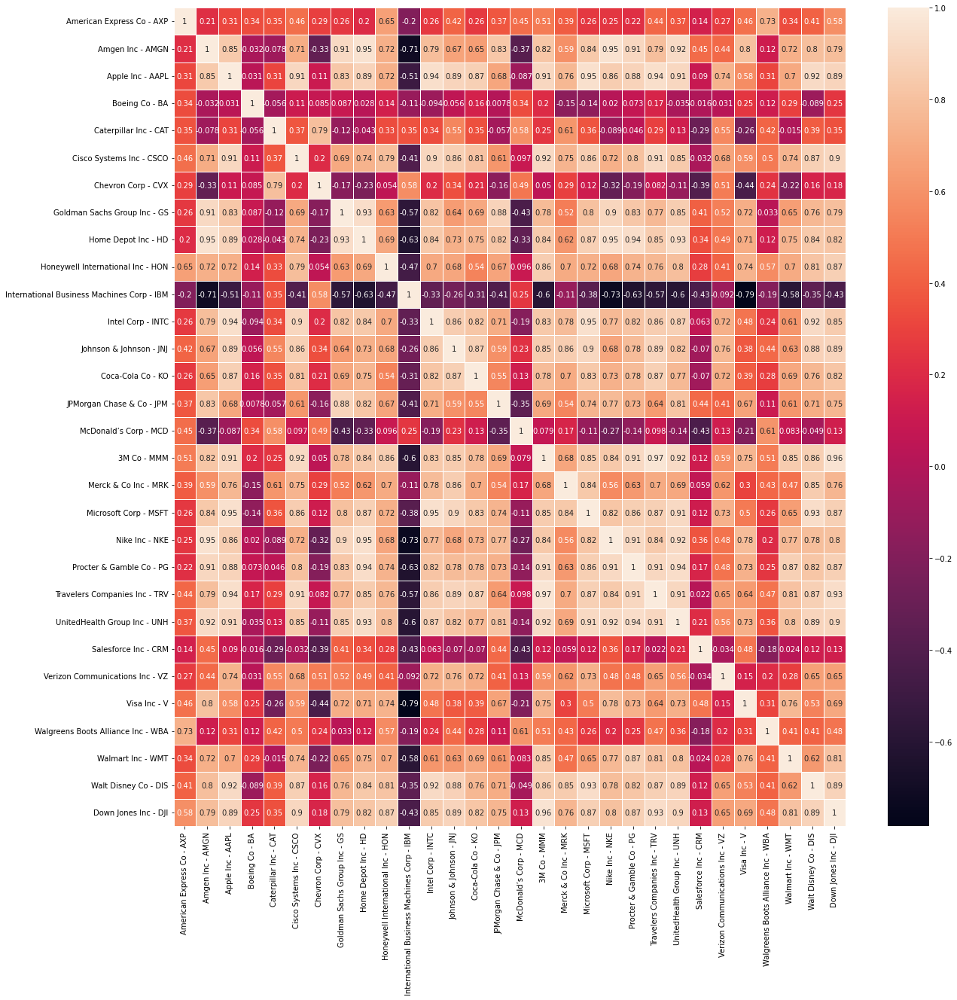


Year: 2014 
Min correlated indexes:
International Business Machines Corp - IBM -0.7851378620157405
-----------------
Correlation value: -0.7851378620157405
Name of the share: Visa Inc - V
-----------------
Correlation value: -0.7341336519504805
Name of the share: Nike Inc - NKE
-----------------
Correlation value: -0.7133198144472183
Name of the share: Amgen Inc - AMGN
-----------------
Correlation value: -0.6319539402157756
Name of the share: Procter & Gamble Co - PG
....................................................................


Portfolio Weight Table For Year: 2015
International Business Machines Corp - IBM Visa Inc - V Nike Inc - NKE Amgen Inc - AMGN Procter & Gamble Co - PG

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1      -0.006820  2.591537
0.2 0.2 0.2 0.2 0.2       0.023276  2.352888


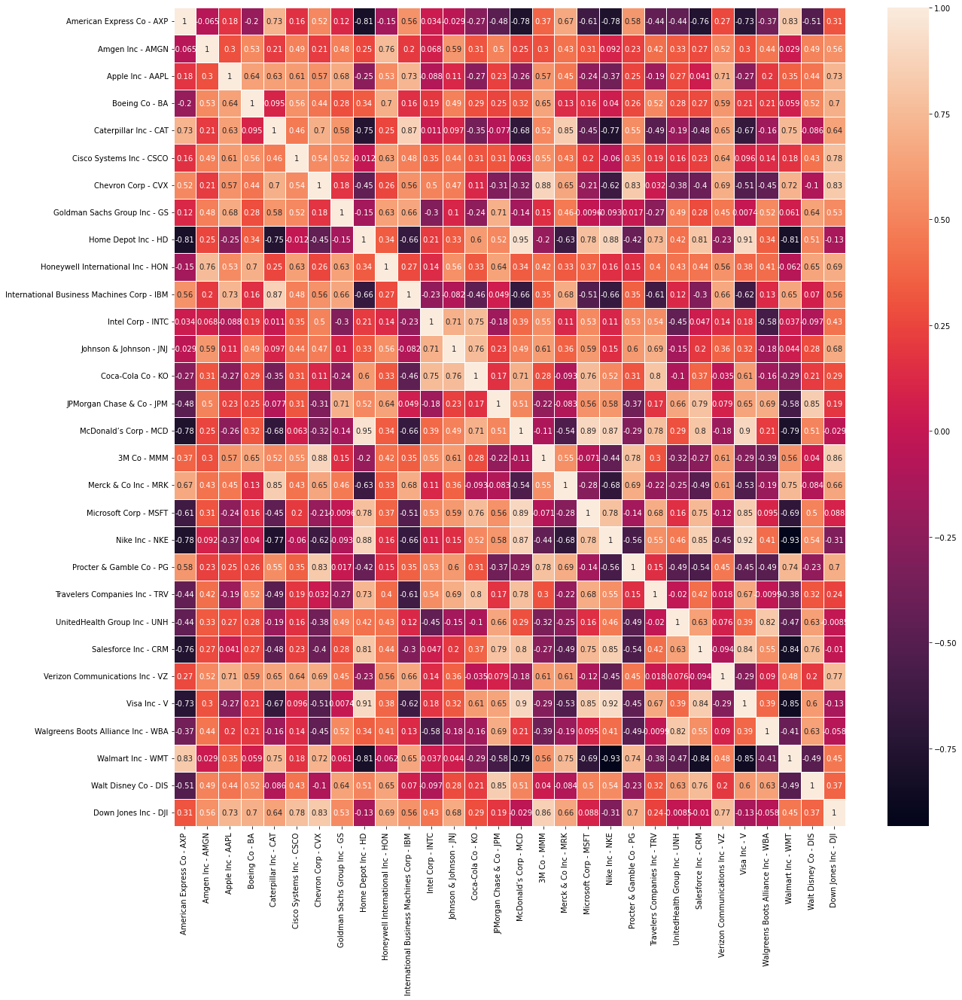


Year: 2015 
Min correlated indexes:
Nike Inc - NKE -0.9347402660518676
-----------------
Correlation value: -0.9347402660518676
Name of the share: Walmart Inc - WMT
-----------------
Correlation value: -0.8545167754062745
Name of the share: Visa Inc - V
-----------------
Correlation value: -0.840736644113166
Name of the share: Salesforce Inc - CRM
-----------------
Correlation value: -0.8132429035580856
Name of the share: Home Depot Inc - HD
....................................................................


Portfolio Weight Table For Year: 2016
Nike Inc - NKE Walmart Inc - WMT Visa Inc - V Salesforce Inc - CRM Home Depot Inc - HD

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1      -0.027443  1.893360
0.2 0.2 0.2 0.2 0.2      -0.003750  2.683568


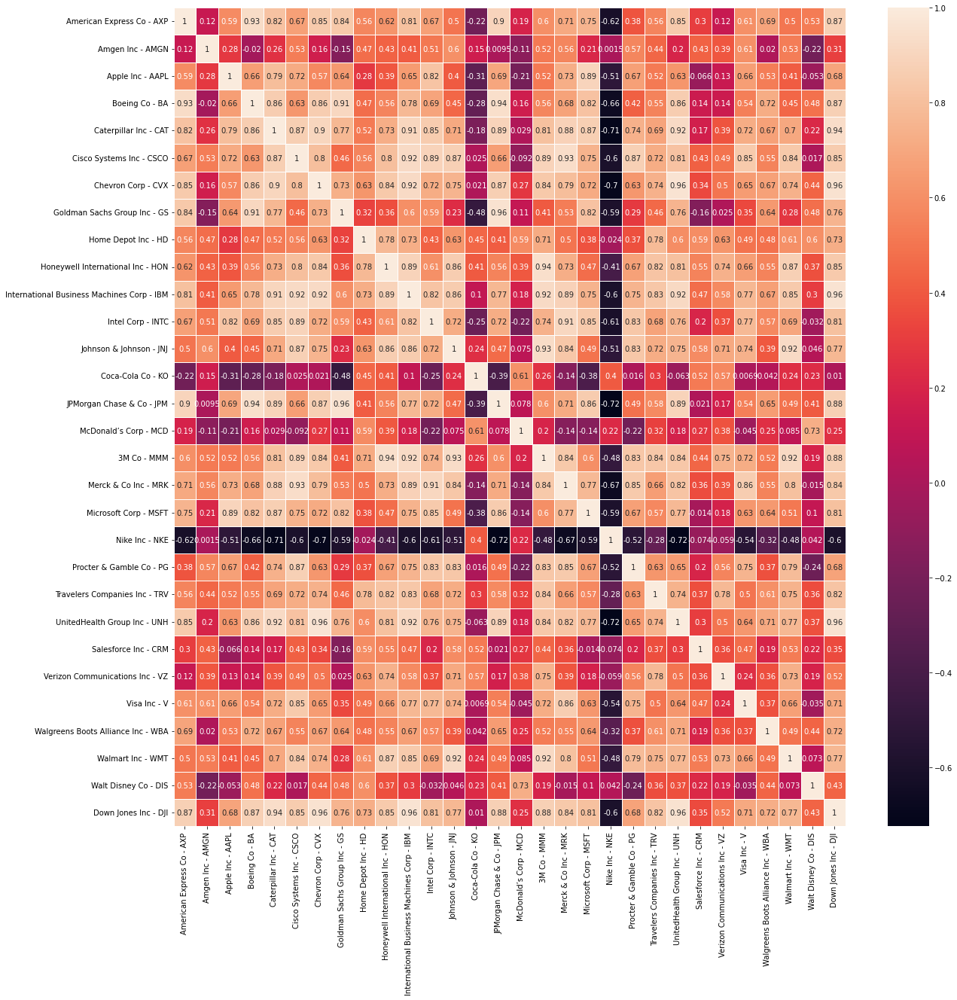


Year: 2016 
Min correlated indexes:
JPMorgan Chase & Co - JPM -0.7242558436713977
-----------------
Correlation value: -0.7242558436713977
Name of the share: Nike Inc - NKE
-----------------
Correlation value: -0.7190480493609187
Name of the share: UnitedHealth Group Inc - UNH
-----------------
Correlation value: -0.7099236642736035
Name of the share: Caterpillar Inc - CAT
-----------------
Correlation value: -0.699630306089556
Name of the share: Chevron Corp - CVX
....................................................................


Portfolio Weight Table For Year: 2017
JPMorgan Chase & Co - JPM Nike Inc - NKE UnitedHealth Group Inc - UNH Caterpillar Inc - CAT Chevron Corp - CVX

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1       0.323705  8.285973
0.2 0.2 0.2 0.2 0.2       0.349304  9.160078


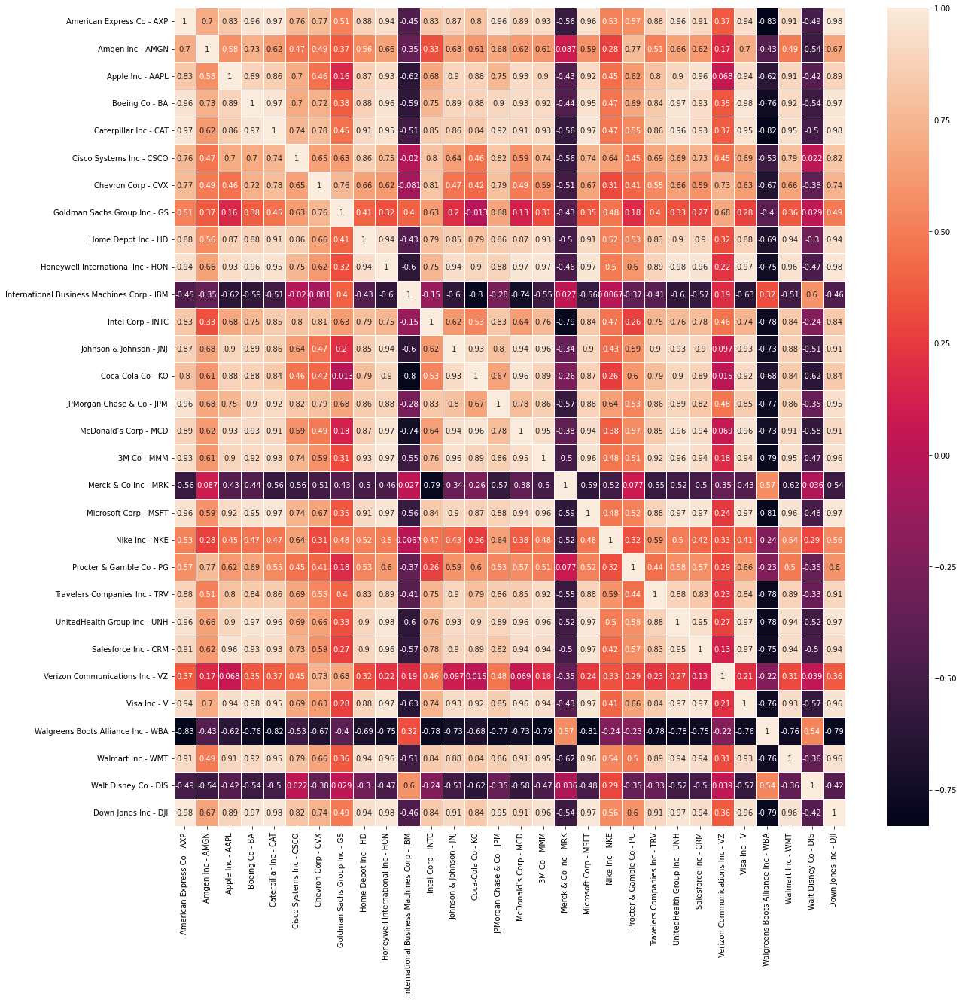


Year: 2017 
Min correlated indexes:
American Express Co - AXP -0.8324311347171839
-----------------
Correlation value: -0.8324311347171839
Name of the share: Walgreens Boots Alliance Inc - WBA
-----------------
Correlation value: -0.8154153181820275
Name of the share: Caterpillar Inc - CAT
-----------------
Correlation value: -0.8104973505643865
Name of the share: Microsoft Corp - MSFT
-----------------
Correlation value: -0.7941560360916664
Name of the share: 3M Co - MMM
....................................................................


Portfolio Weight Table For Year: 2018
American Express Co - AXP Walgreens Boots Alliance Inc - WBA Caterpillar Inc - CAT Microsoft Corp - MSFT 3M Co - MMM

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1      -0.078375  3.899116
0.2 0.2 0.2 0.2 0.2      -0.083654  4.453392


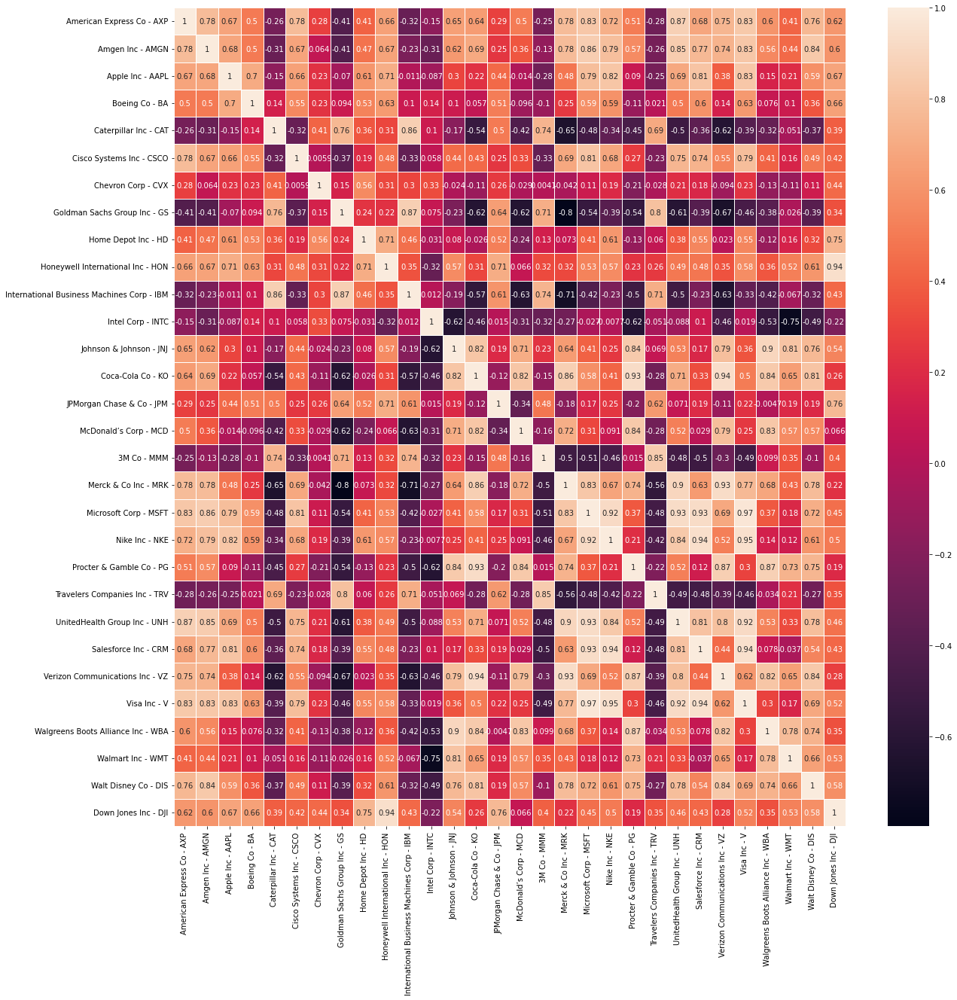


Year: 2018 
Min correlated indexes:
Goldman Sachs Group Inc - GS -0.7979977120878168
-----------------
Correlation value: -0.7979977120878168
Name of the share: Merck & Co Inc - MRK
-----------------
Correlation value: -0.7052229660420266
Name of the share: International Business Machines Corp - IBM
-----------------
Correlation value: -0.6680322235738789
Name of the share: Verizon Communications Inc - VZ
-----------------
Correlation value: -0.6541394460709458
Name of the share: Caterpillar Inc - CAT
....................................................................


Portfolio Weight Table For Year: 2019
Goldman Sachs Group Inc - GS Merck & Co Inc - MRK International Business Machines Corp - IBM Verizon Communications Inc - VZ Caterpillar Inc - CAT

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1       0.299058  6.933801
0.2 0.2 0.2 0.2 0.2       0.257953  5.221916


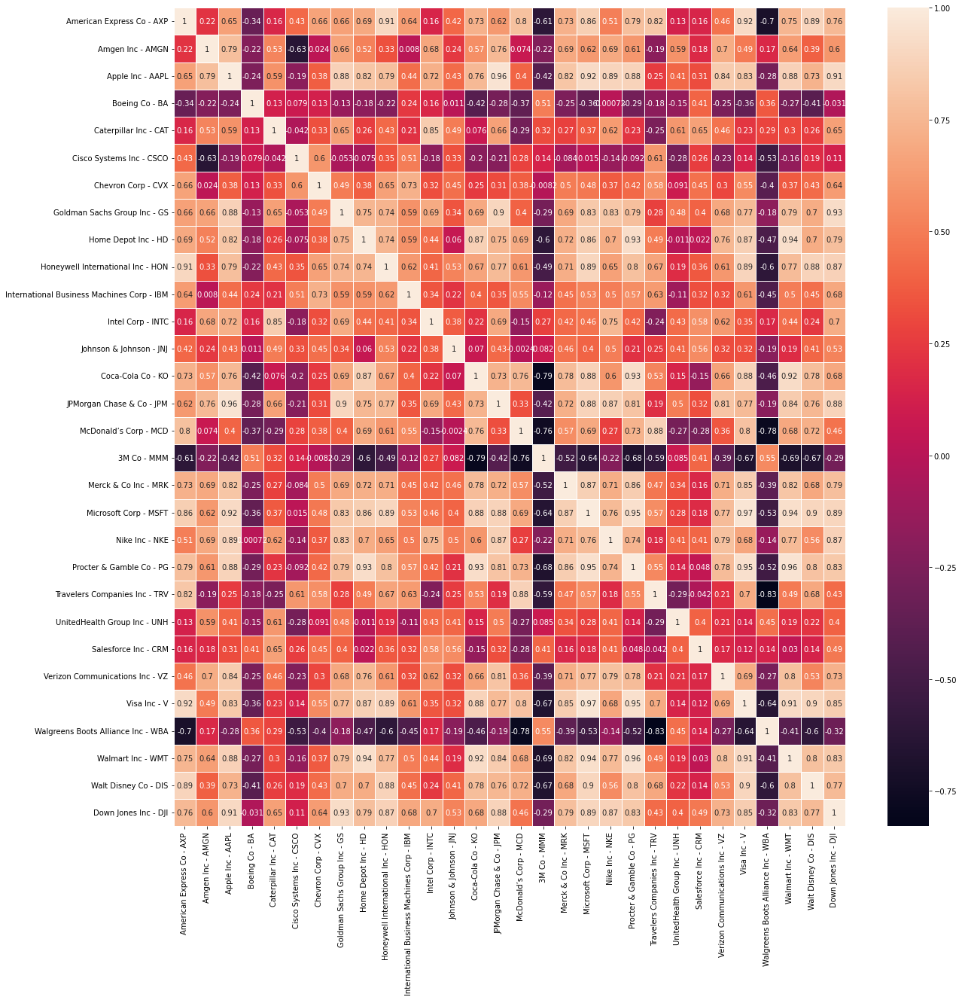


Year: 2019 
Min correlated indexes:
Travelers Companies Inc - TRV -0.8292379530687956
-----------------
Correlation value: -0.8292379530687956
Name of the share: Walgreens Boots Alliance Inc - WBA
-----------------
Correlation value: -0.7805057280203708
Name of the share: McDonald’s Corp - MCD
-----------------
Correlation value: -0.7042721148744279
Name of the share: American Express Co - AXP
-----------------
Correlation value: -0.6382234447305309
Name of the share: Visa Inc - V
....................................................................


Portfolio Weight Table For Year: 2020
Travelers Companies Inc - TRV Walgreens Boots Alliance Inc - WBA McDonald’s Corp - MCD American Express Co - AXP Visa Inc - V

                      Annual Return    Std Dev
Weight                                       
0.4 0.2 0.2 0.1 0.1       0.042126  11.262936
0.2 0.2 0.2 0.2 0.2       0.049923  11.402238

----------------- TABLE -------------------------

For weight ratio [0.08707839 0.16667553 

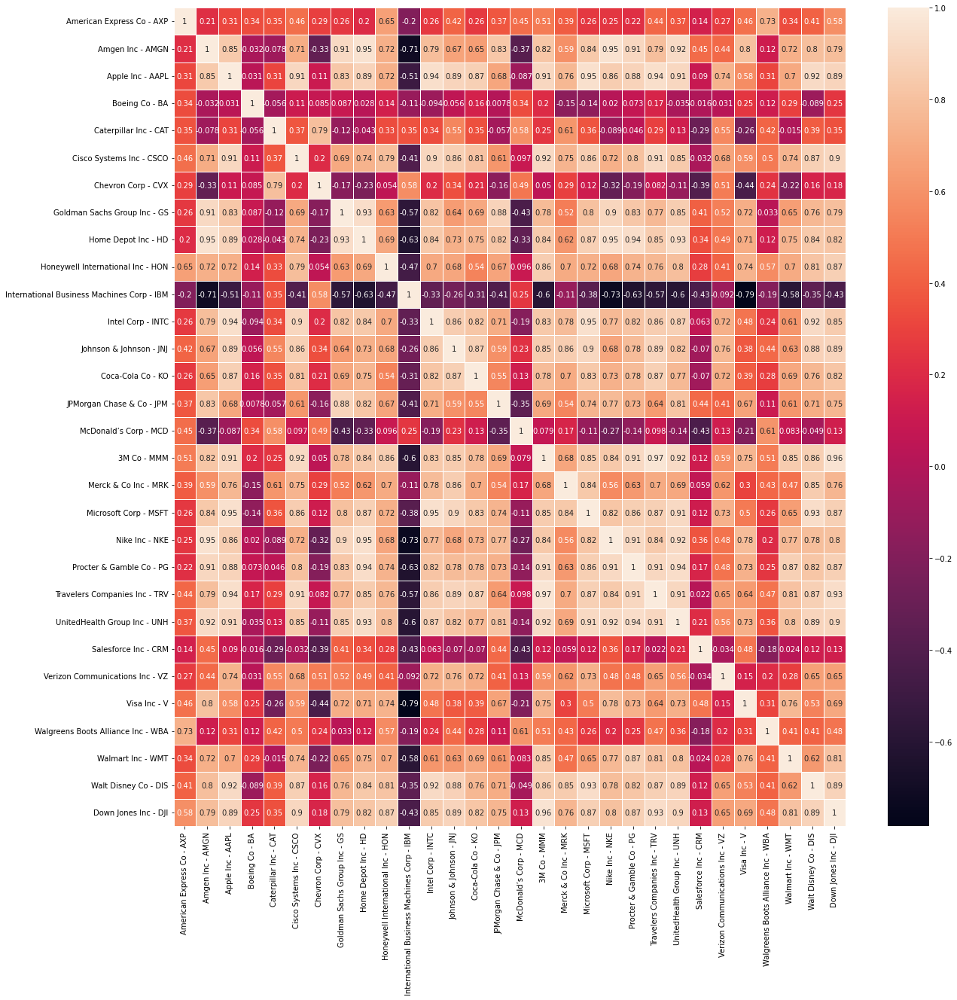


Year: 2014 
Min correlated indexes:
International Business Machines Corp - IBM -0.7851378620157405
-----------------
Correlation value: -0.7851378620157405
Name of the share: Visa Inc - V
-----------------
Correlation value: -0.7341336519504805
Name of the share: Nike Inc - NKE
-----------------
Correlation value: -0.7133198144472183
Name of the share: Amgen Inc - AMGN
-----------------
Correlation value: -0.6319539402157756
Name of the share: Procter & Gamble Co - PG
....................................................................


Portfolio Weight Table For Year: 2015
International Business Machines Corp - IBM Visa Inc - V Nike Inc - NKE Amgen Inc - AMGN Procter & Gamble Co - PG

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1      -0.006820  2.591537
0.2 0.2 0.2 0.2 0.2       0.023276  2.352888


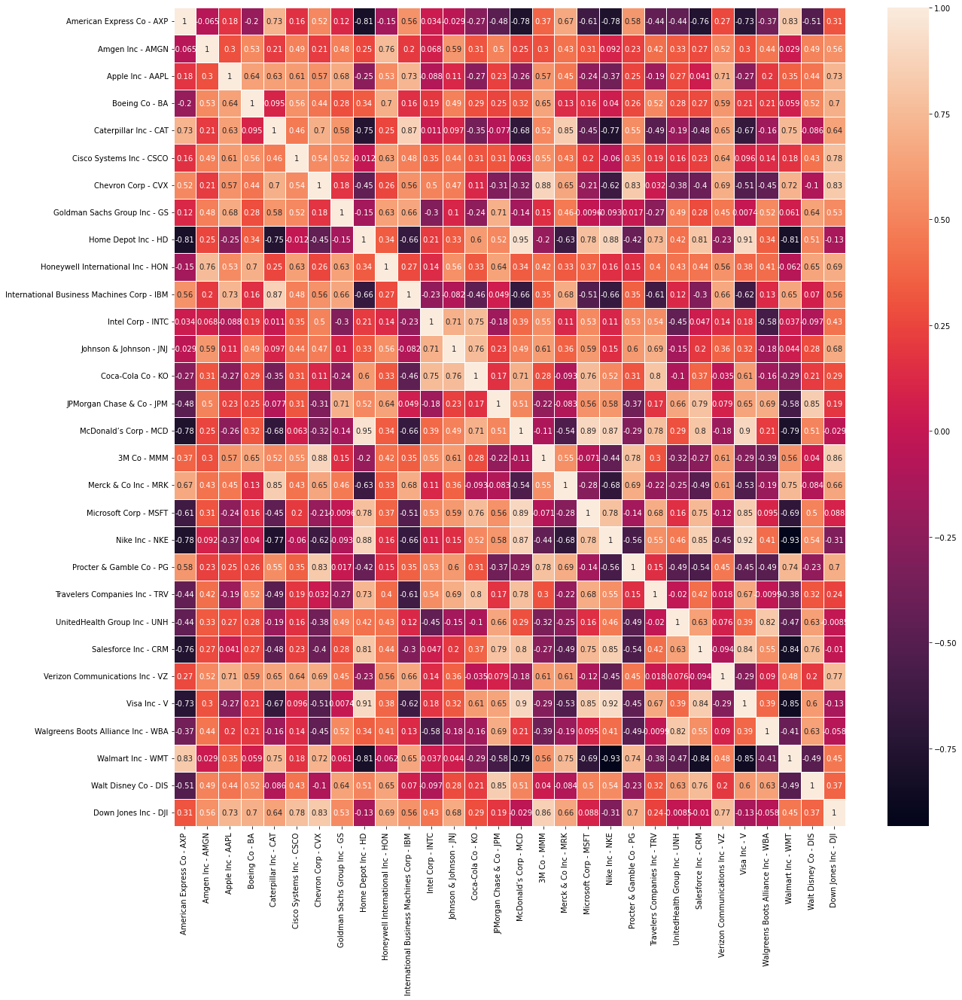


Year: 2015 
Min correlated indexes:
Nike Inc - NKE -0.9347402660518676
-----------------
Correlation value: -0.9347402660518676
Name of the share: Walmart Inc - WMT
-----------------
Correlation value: -0.8545167754062745
Name of the share: Visa Inc - V
-----------------
Correlation value: -0.840736644113166
Name of the share: Salesforce Inc - CRM
-----------------
Correlation value: -0.8132429035580856
Name of the share: Home Depot Inc - HD
....................................................................


Portfolio Weight Table For Year: 2016
Nike Inc - NKE Walmart Inc - WMT Visa Inc - V Salesforce Inc - CRM Home Depot Inc - HD

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1      -0.027443  1.893360
0.2 0.2 0.2 0.2 0.2      -0.003750  2.683568


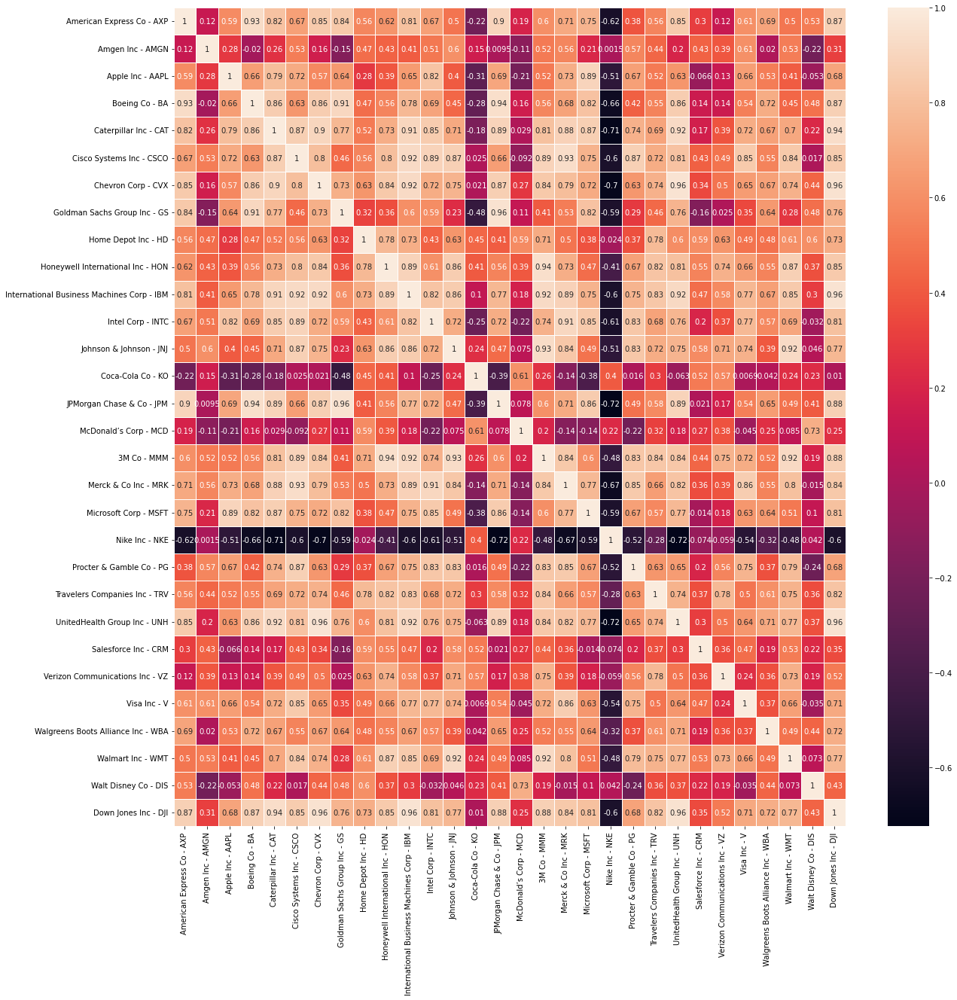


Year: 2016 
Min correlated indexes:
JPMorgan Chase & Co - JPM -0.7242558436713977
-----------------
Correlation value: -0.7242558436713977
Name of the share: Nike Inc - NKE
-----------------
Correlation value: -0.7190480493609187
Name of the share: UnitedHealth Group Inc - UNH
-----------------
Correlation value: -0.7099236642736035
Name of the share: Caterpillar Inc - CAT
-----------------
Correlation value: -0.699630306089556
Name of the share: Chevron Corp - CVX
....................................................................


Portfolio Weight Table For Year: 2017
JPMorgan Chase & Co - JPM Nike Inc - NKE UnitedHealth Group Inc - UNH Caterpillar Inc - CAT Chevron Corp - CVX

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1       0.323705  8.285973
0.2 0.2 0.2 0.2 0.2       0.349304  9.160078


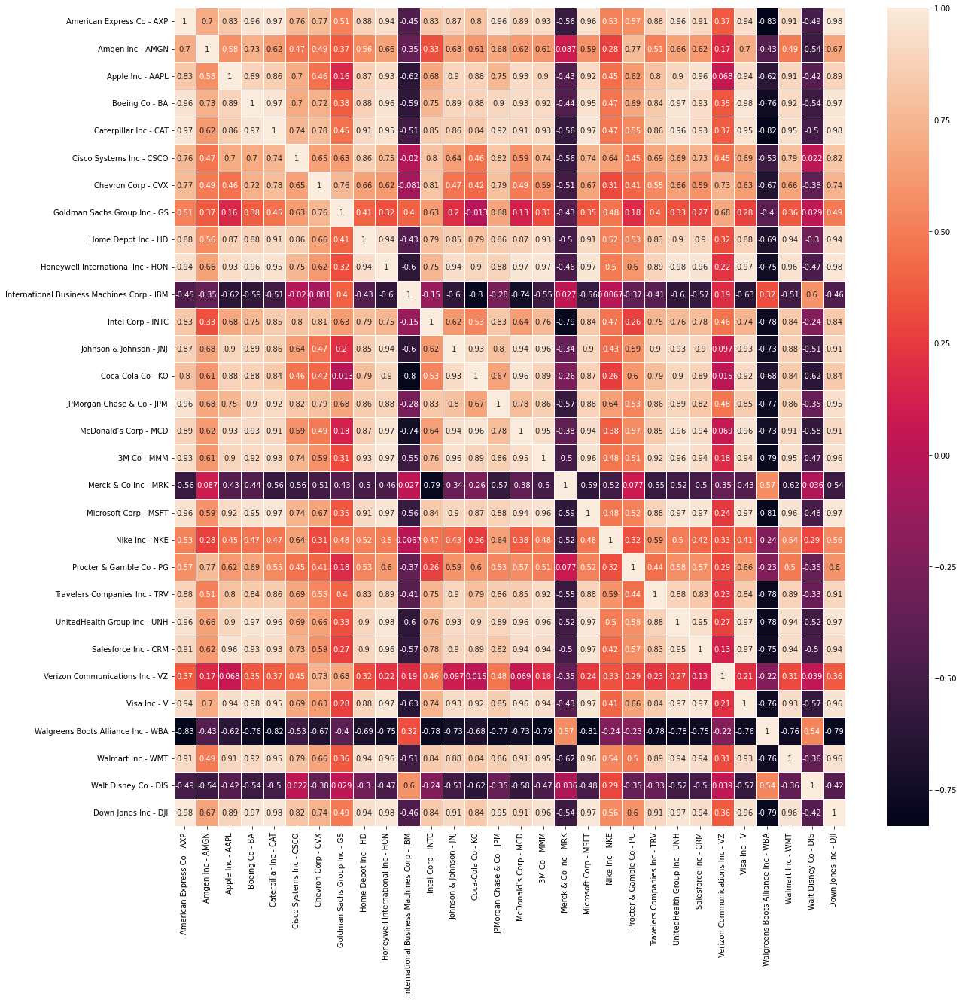


Year: 2017 
Min correlated indexes:
American Express Co - AXP -0.8324311347171839
-----------------
Correlation value: -0.8324311347171839
Name of the share: Walgreens Boots Alliance Inc - WBA
-----------------
Correlation value: -0.8154153181820275
Name of the share: Caterpillar Inc - CAT
-----------------
Correlation value: -0.8104973505643865
Name of the share: Microsoft Corp - MSFT
-----------------
Correlation value: -0.7941560360916664
Name of the share: 3M Co - MMM
....................................................................


Portfolio Weight Table For Year: 2018
American Express Co - AXP Walgreens Boots Alliance Inc - WBA Caterpillar Inc - CAT Microsoft Corp - MSFT 3M Co - MMM

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1      -0.078375  3.899116
0.2 0.2 0.2 0.2 0.2      -0.083654  4.453392


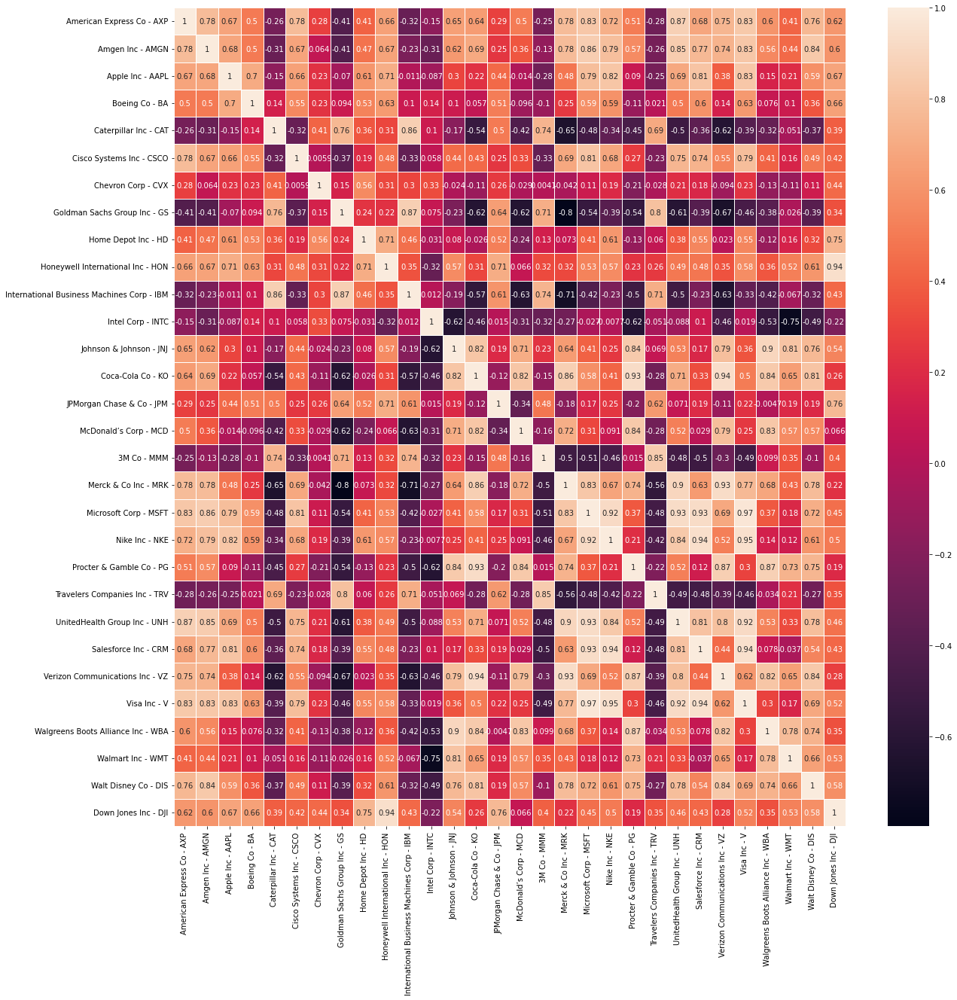


Year: 2018 
Min correlated indexes:
Goldman Sachs Group Inc - GS -0.7979977120878168
-----------------
Correlation value: -0.7979977120878168
Name of the share: Merck & Co Inc - MRK
-----------------
Correlation value: -0.7052229660420266
Name of the share: International Business Machines Corp - IBM
-----------------
Correlation value: -0.6680322235738789
Name of the share: Verizon Communications Inc - VZ
-----------------
Correlation value: -0.6541394460709458
Name of the share: Caterpillar Inc - CAT
....................................................................


Portfolio Weight Table For Year: 2019
Goldman Sachs Group Inc - GS Merck & Co Inc - MRK International Business Machines Corp - IBM Verizon Communications Inc - VZ Caterpillar Inc - CAT

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1       0.299058  6.933801
0.2 0.2 0.2 0.2 0.2       0.257953  5.221916


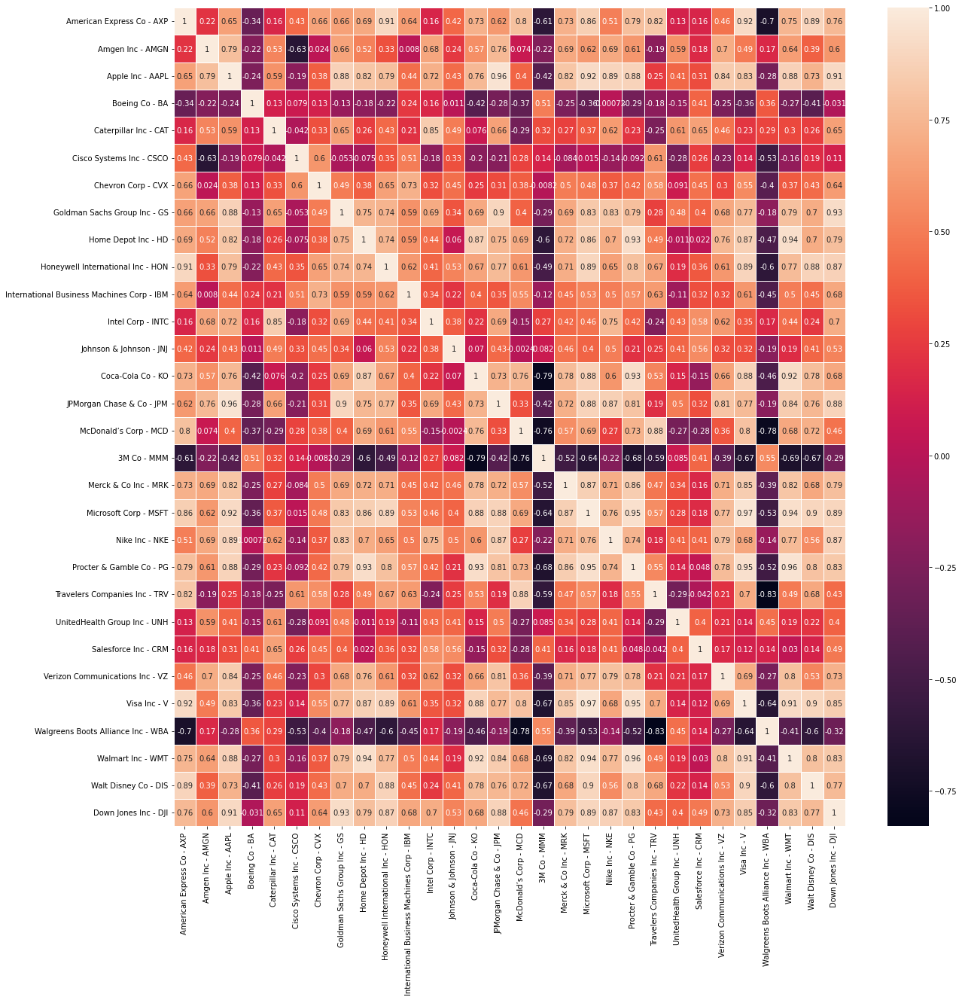


Year: 2019 
Min correlated indexes:
Travelers Companies Inc - TRV -0.8292379530687956
-----------------
Correlation value: -0.8292379530687956
Name of the share: Walgreens Boots Alliance Inc - WBA
-----------------
Correlation value: -0.7805057280203708
Name of the share: McDonald’s Corp - MCD
-----------------
Correlation value: -0.7042721148744279
Name of the share: American Express Co - AXP
-----------------
Correlation value: -0.6382234447305309
Name of the share: Visa Inc - V
....................................................................


Portfolio Weight Table For Year: 2020
Travelers Companies Inc - TRV Walgreens Boots Alliance Inc - WBA McDonald’s Corp - MCD American Express Co - AXP Visa Inc - V

                      Annual Return    Std Dev
Weight                                       
0.4 0.2 0.2 0.1 0.1       0.042126  11.262936
0.2 0.2 0.2 0.2 0.2       0.049923  11.402238

----------------- TABLE -------------------------

For weight ratio [0.3001615  0.20978599 

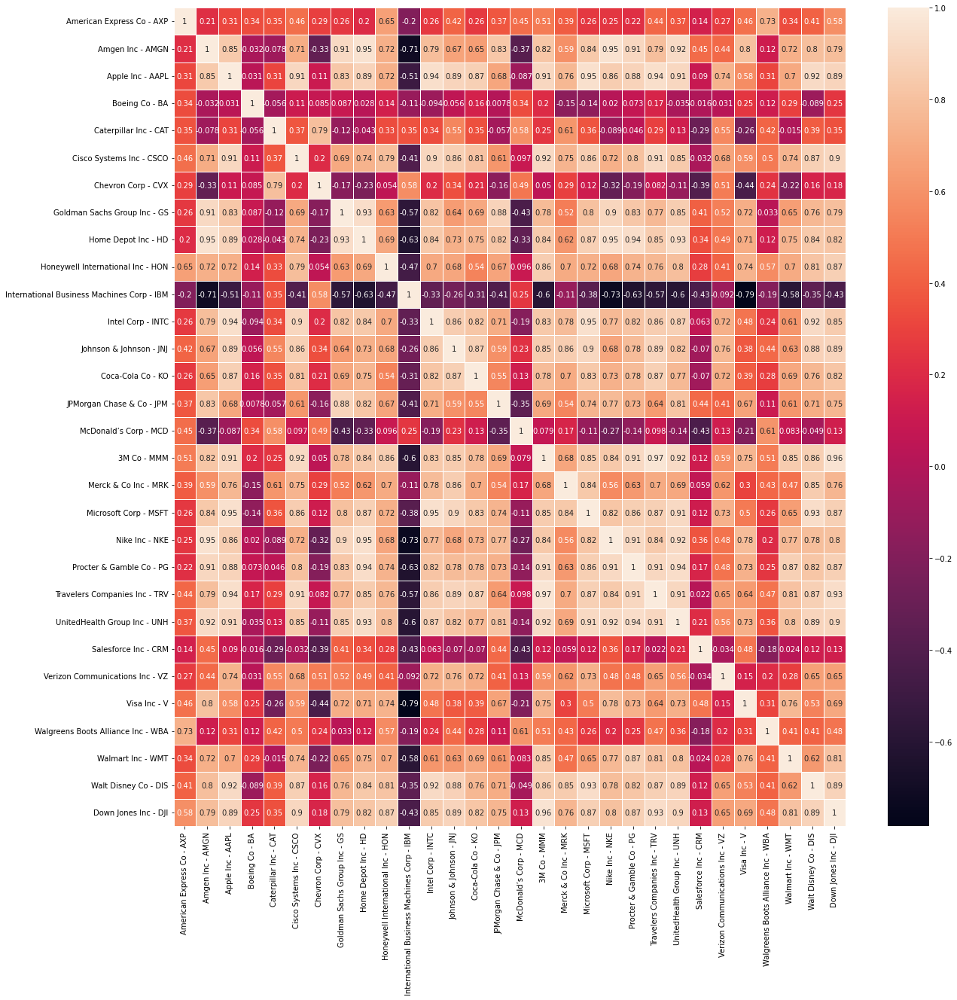


Year: 2014 
Min correlated indexes:
International Business Machines Corp - IBM -0.7851378620157405
-----------------
Correlation value: -0.7851378620157405
Name of the share: Visa Inc - V
-----------------
Correlation value: -0.7341336519504805
Name of the share: Nike Inc - NKE
-----------------
Correlation value: -0.7133198144472183
Name of the share: Amgen Inc - AMGN
-----------------
Correlation value: -0.6319539402157756
Name of the share: Procter & Gamble Co - PG
....................................................................


Portfolio Weight Table For Year: 2015
International Business Machines Corp - IBM Visa Inc - V Nike Inc - NKE Amgen Inc - AMGN Procter & Gamble Co - PG

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1      -0.006820  2.591537
0.2 0.2 0.2 0.2 0.2       0.023276  2.352888


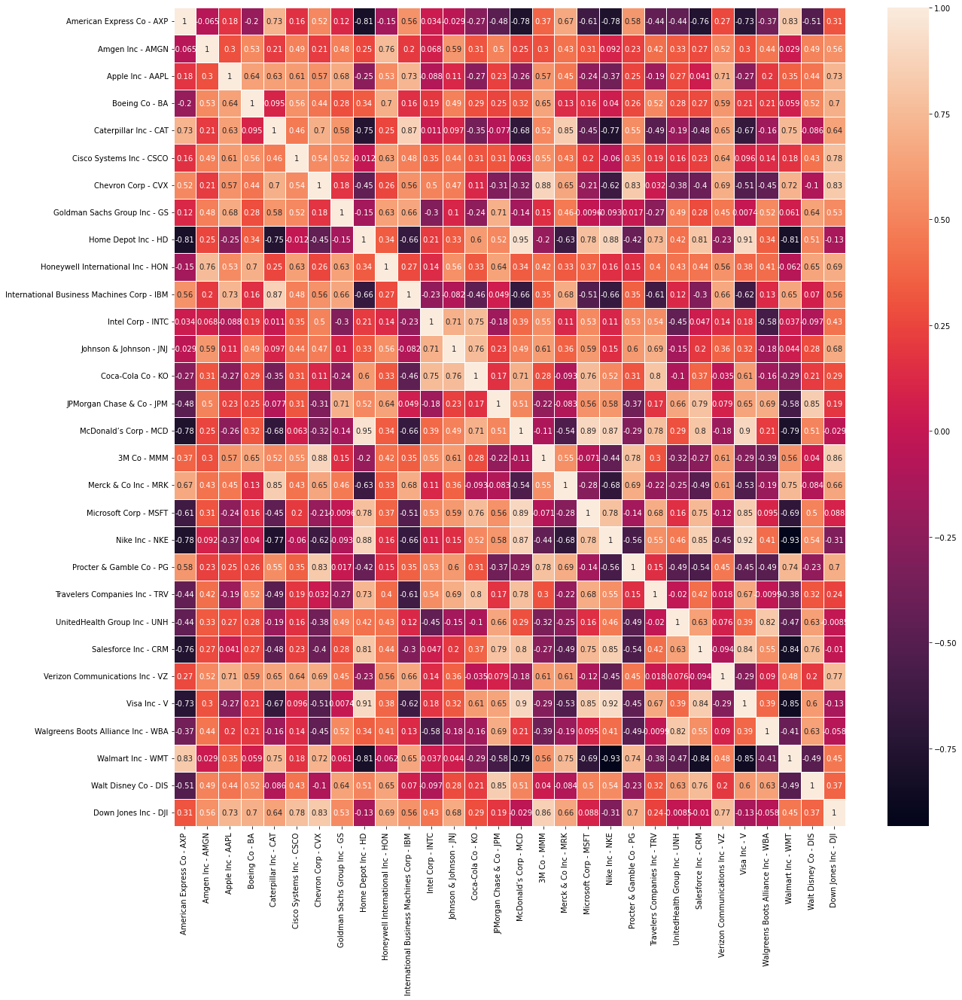


Year: 2015 
Min correlated indexes:
Nike Inc - NKE -0.9347402660518676
-----------------
Correlation value: -0.9347402660518676
Name of the share: Walmart Inc - WMT
-----------------
Correlation value: -0.8545167754062745
Name of the share: Visa Inc - V
-----------------
Correlation value: -0.840736644113166
Name of the share: Salesforce Inc - CRM
-----------------
Correlation value: -0.8132429035580856
Name of the share: Home Depot Inc - HD
....................................................................


Portfolio Weight Table For Year: 2016
Nike Inc - NKE Walmart Inc - WMT Visa Inc - V Salesforce Inc - CRM Home Depot Inc - HD

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1      -0.027443  1.893360
0.2 0.2 0.2 0.2 0.2      -0.003750  2.683568


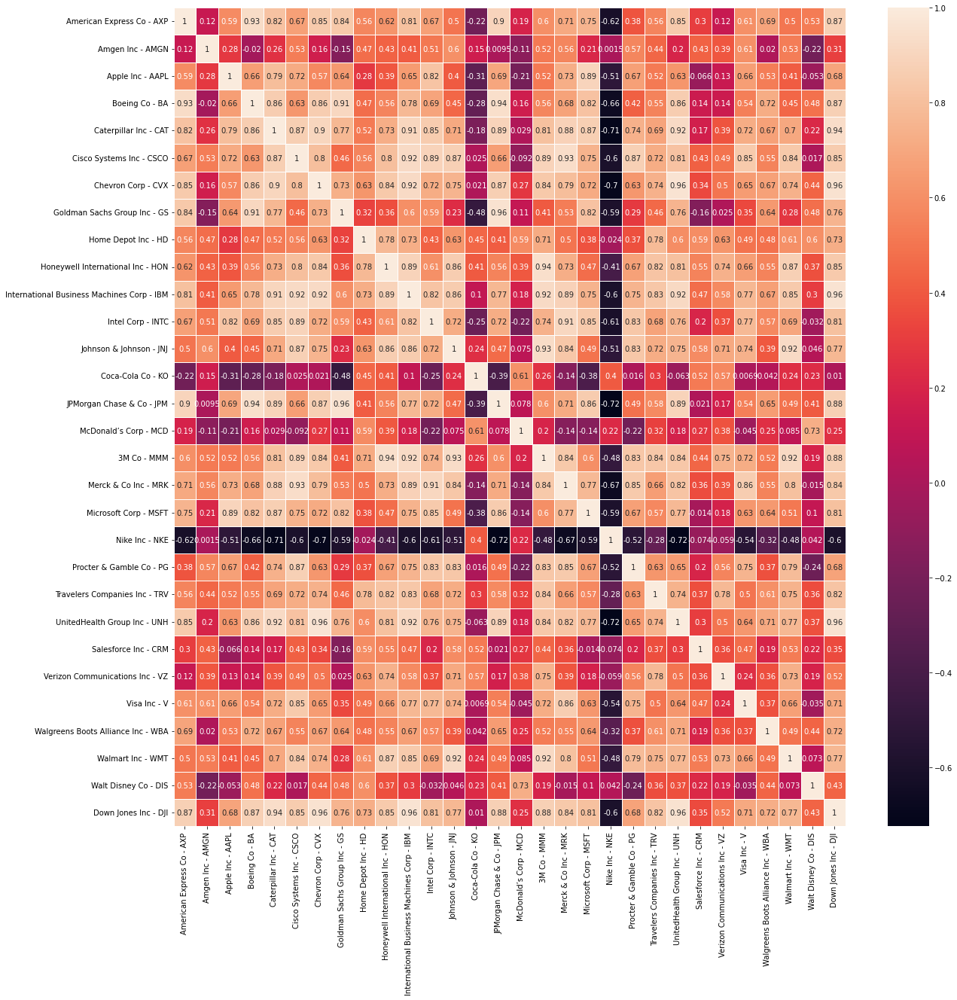


Year: 2016 
Min correlated indexes:
JPMorgan Chase & Co - JPM -0.7242558436713977
-----------------
Correlation value: -0.7242558436713977
Name of the share: Nike Inc - NKE
-----------------
Correlation value: -0.7190480493609187
Name of the share: UnitedHealth Group Inc - UNH
-----------------
Correlation value: -0.7099236642736035
Name of the share: Caterpillar Inc - CAT
-----------------
Correlation value: -0.699630306089556
Name of the share: Chevron Corp - CVX
....................................................................


Portfolio Weight Table For Year: 2017
JPMorgan Chase & Co - JPM Nike Inc - NKE UnitedHealth Group Inc - UNH Caterpillar Inc - CAT Chevron Corp - CVX

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1       0.323705  8.285973
0.2 0.2 0.2 0.2 0.2       0.349304  9.160078


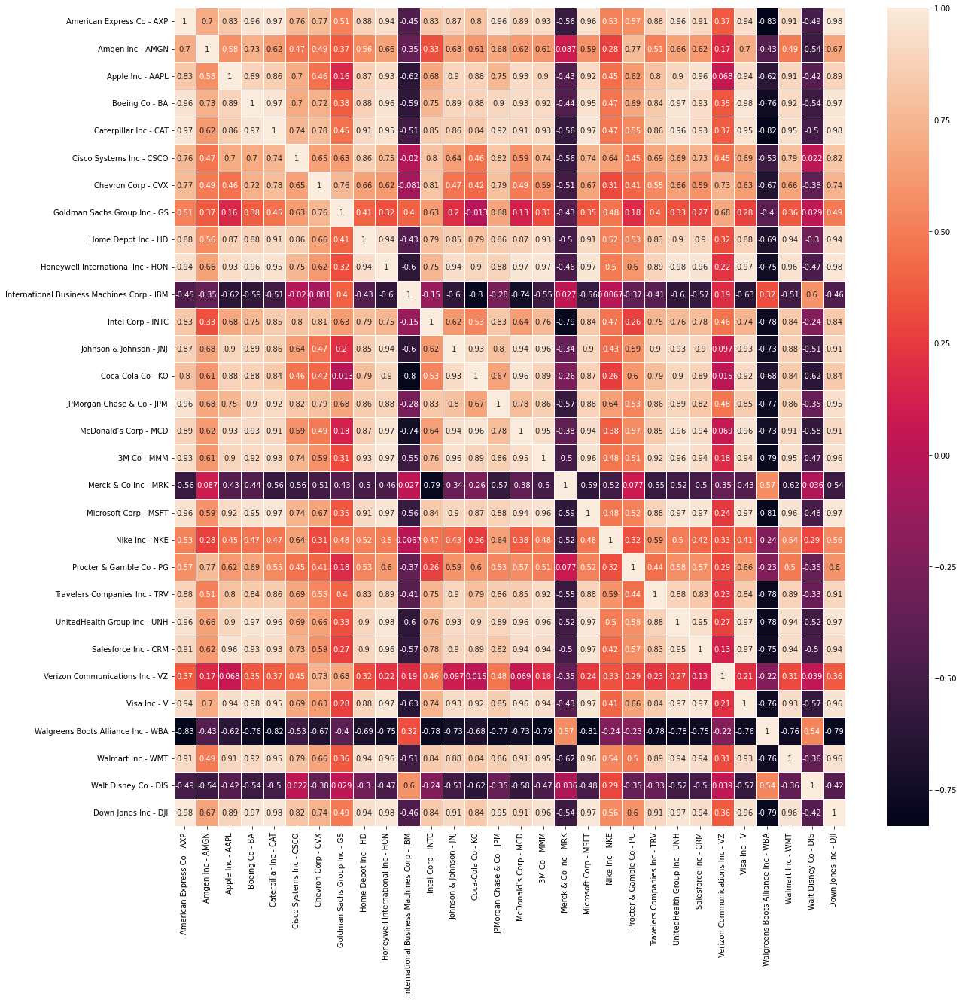


Year: 2017 
Min correlated indexes:
American Express Co - AXP -0.8324311347171839
-----------------
Correlation value: -0.8324311347171839
Name of the share: Walgreens Boots Alliance Inc - WBA
-----------------
Correlation value: -0.8154153181820275
Name of the share: Caterpillar Inc - CAT
-----------------
Correlation value: -0.8104973505643865
Name of the share: Microsoft Corp - MSFT
-----------------
Correlation value: -0.7941560360916664
Name of the share: 3M Co - MMM
....................................................................


Portfolio Weight Table For Year: 2018
American Express Co - AXP Walgreens Boots Alliance Inc - WBA Caterpillar Inc - CAT Microsoft Corp - MSFT 3M Co - MMM

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1      -0.078375  3.899116
0.2 0.2 0.2 0.2 0.2      -0.083654  4.453392


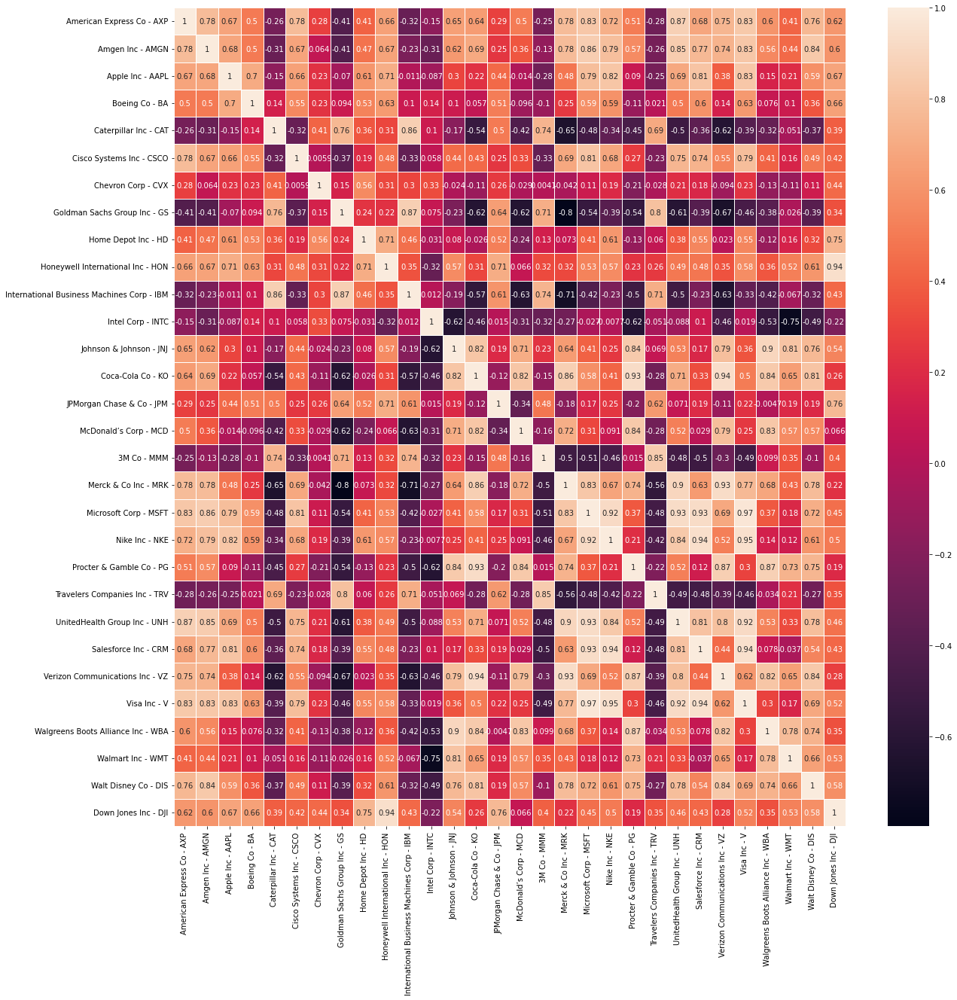


Year: 2018 
Min correlated indexes:
Goldman Sachs Group Inc - GS -0.7979977120878168
-----------------
Correlation value: -0.7979977120878168
Name of the share: Merck & Co Inc - MRK
-----------------
Correlation value: -0.7052229660420266
Name of the share: International Business Machines Corp - IBM
-----------------
Correlation value: -0.6680322235738789
Name of the share: Verizon Communications Inc - VZ
-----------------
Correlation value: -0.6541394460709458
Name of the share: Caterpillar Inc - CAT
....................................................................


Portfolio Weight Table For Year: 2019
Goldman Sachs Group Inc - GS Merck & Co Inc - MRK International Business Machines Corp - IBM Verizon Communications Inc - VZ Caterpillar Inc - CAT

                      Annual Return   Std Dev
Weight                                      
0.4 0.2 0.2 0.1 0.1       0.299058  6.933801
0.2 0.2 0.2 0.2 0.2       0.257953  5.221916


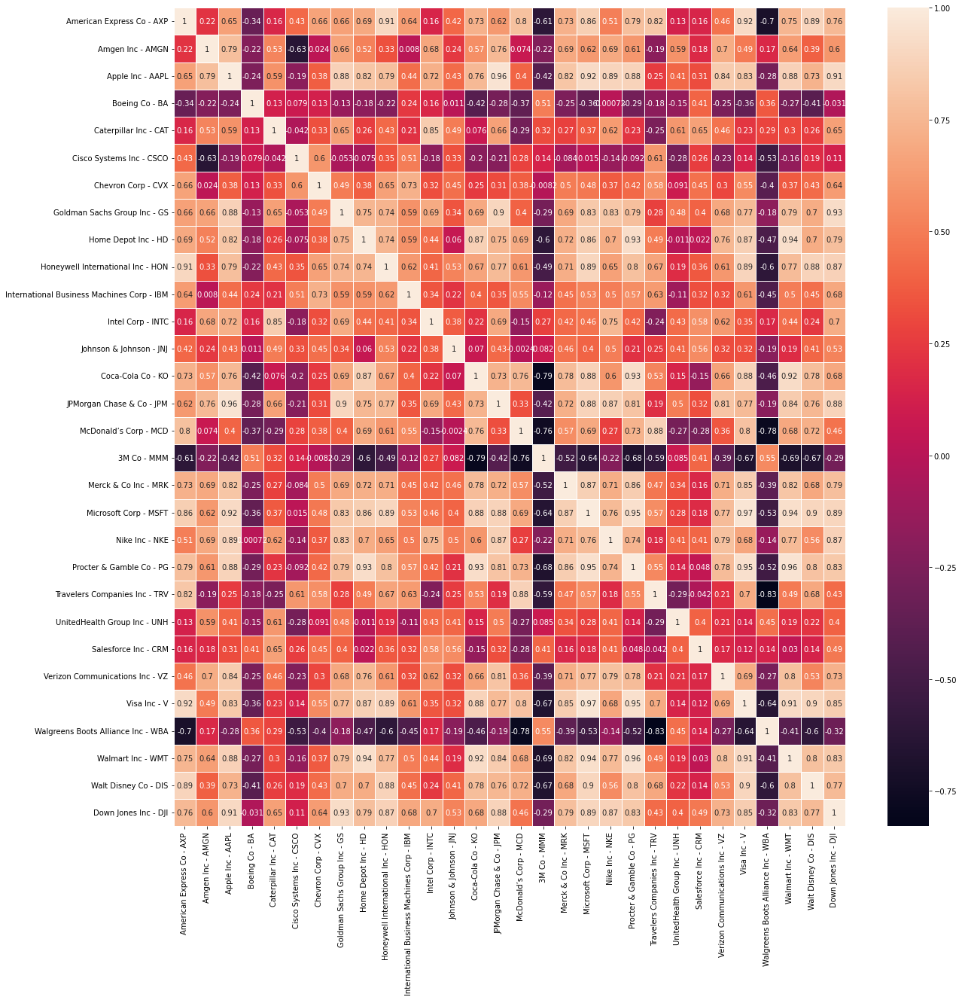


Year: 2019 
Min correlated indexes:
Travelers Companies Inc - TRV -0.8292379530687956
-----------------
Correlation value: -0.8292379530687956
Name of the share: Walgreens Boots Alliance Inc - WBA
-----------------
Correlation value: -0.7805057280203708
Name of the share: McDonald’s Corp - MCD
-----------------
Correlation value: -0.7042721148744279
Name of the share: American Express Co - AXP
-----------------
Correlation value: -0.6382234447305309
Name of the share: Visa Inc - V
....................................................................


Portfolio Weight Table For Year: 2020
Travelers Companies Inc - TRV Walgreens Boots Alliance Inc - WBA McDonald’s Corp - MCD American Express Co - AXP Visa Inc - V

                      Annual Return    Std Dev
Weight                                       
0.4 0.2 0.2 0.1 0.1       0.042126  11.262936
0.2 0.2 0.2 0.2 0.2       0.049923  11.402238

----------------- TABLE -------------------------

For weight ratio [0.06891926 0.52147249 

In [51]:
# Build a portfolio with 5 stocks which had lowest correlations among eachother last year
annualReturn = []
stdDev = []
sharpeRatio = []
maxDrawdowns = []
# A key value paired dictionary that holds each year's most correlated top 5 shares
share_dict = { 2015: [], 2016: [], 2017: [], 2018: [], 2019: [], 2020: [], 2021: [], 2022: []} 
weight_arr = [[0.4, 0.2, 0.2, 0.1, 0.1], [0.2, 0.2, 0.2, 0.2, 0.2]] 
for n in range(1, 4):
    weights = np.random.rand(5)
    weights = weights / np.sum(weights)
    annual_return_in = []
    std_deviation_in = []
    sharpe_ratio_in = []
    max_drawdown_in = []
    years = []
    for i in range(2014, 2020):
        years.append(i+1)
        corr = CorrMatrices[i - 2014]

        fig, ax = plt.subplots(figsize=(20,20)) 
        sn.heatmap(corr, annot=True, linewidths=.5, ax=ax)
        plt.show()

        # Find min value of correlation matrix
        minVal = np.min(corr.min())
        # Find the minimum value's first location  
        loc_min = np.where(corr == minVal)[0]
        loc_i = loc_min[0]
        loc_j = loc_min[1]
    
        # Find next smallest value's indexes in corr matrix 
        resultNames1, resultIndexes1 = getNSmallestStockNamesAndIndexes(corr[names[loc_i]], 5)
        resultNames2, resultIndexes2 = getNSmallestStockNamesAndIndexes(corr[names[loc_j]], 5)
        resValues1 = []
        resValues2 = []
        arr = []
        arr.append([loc_min[0], loc_min[1]])
        # Get real values in order to compare two list
        temp = []
        for m in range(len(resultIndexes1)):
            if resultIndexes1[m] != loc_j:
                temp.append(corr[names[loc_i]][resultIndexes1[m]]) 
        for m in range(len(resultIndexes2)):
            if resultIndexes2[m] != loc_i:
                temp.append(corr[names[loc_j]][resultIndexes2[m]]) 
        # Sort the real values
        _ , resultIndexesFinal = getNSmallestStockNamesAndIndexes(temp, 5)
        #print(resultIndexesFinal)
        #Get the indexes that corresponds to sorted min values
        p = []
        for j in range(len(resultIndexesFinal)):
            p.append(temp[resultIndexesFinal[j]])
        for j in range(len(p)):
            for m in range(len(corr[names[loc_i]])):
                if(corr[names[loc_i]][m] == p[j]):
                    arr.append([loc_i, m])
                elif(corr[names[loc_j]][m] == p[j]):
                    arr.append([loc_j, m])
        if(len(share_dict[i+1]) == 0):
            share_dict[i+1] = arr
        #define df for calculations
        res = pd.DataFrame()
        print("\nYear:", i, "\nMin correlated indexes:")
        print(names[arr[0][0]], corr[names[arr[0][0]]][arr[0][1]])
        res[names[arr[0][0]]] = indexes[arr[0][0]]['adjclose'][indexes[arr[0][0]]['year'] == i + 1]
        for j in range(4):
            print("-----------------")
            print("Correlation value:", corr[names[arr[j][0]]][arr[j][1]])
            print("Name of the share:", names[arr[j][1]])
            res[names[arr[j][1]]] = indexes[arr[j][1]]['adjclose'][indexes[arr[j][1]]['year'] == i + 1]
        print("....................................................................\n")
        temp = res * weights
        temp["Total"] = temp.sum(1)
        annual_return, std_deviation, max_drawdown, sharpe_ratio = OneYearCalculator(temp["Total"])
        annual_return_in.append(annual_return)
        std_deviation_in.append(std_deviation)
        sharpe_ratio_in.append(sharpe_ratio)
        max_drawdown_in.append(max_drawdown)
        print("\nPortfolio Weight Table For Year:", i + 1)
        print(names[arr[0][0]], names[arr[0][1]], names[arr[1][1]], names[arr[2][1]], names[arr[3][1]])
        std_dev_temp = []
        ar_temp = []
        weight_str = []
        for j in range(len(weight_arr)):
            weight = weight_arr[j]
            temp = res * weight
            temp["Total"] = temp.sum(1)
            annual_return, std_deviation, _, _ = OneYearCalculator(temp["Total"])
            std_dev_temp.append(std_deviation),
            ar_temp.append(annual_return)
            weight_str.append(' '.join(map(str, weight_arr[j])))
        frame = { 'Annual Return': ar_temp, 'Std Dev': std_dev_temp, 'Weight': weight_str}
        result = pd.DataFrame(frame)
        result = result.set_index('Weight')
        print("\n", result)
        

    print("\n----------------- TABLE -------------------------\n")
    print("For weight ratio", weights )
    annualReturn = np.array(annual_return_in)
    stdDev = np.array(std_deviation_in)
    sharpeRatio = np.array(sharpe_ratio_in)
    maxDrawdowns = np.array(max_drawdown_in)

    frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
    result = pd.DataFrame(frame)
    result = result.set_index('Date')
    print(result)
    print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(sharpeRatio), "\n")

       

In [52]:
print(share_dict)

{2015: [[10, 25], [10, 19], [10, 1], [10, 20], [10, 8], [25, 6]], 2016: [[19, 27], [27, 25], [27, 23], [27, 8], [27, 15], [19, 0]], 2017: [[14, 19], [19, 22], [19, 4], [19, 6], [19, 17], [14, 13]], 2018: [[0, 26], [26, 4], [26, 18], [26, 16], [26, 29], [0, 17]], 2019: [[7, 17], [17, 10], [7, 24], [17, 4], [7, 15], [7, 13]], 2020: [[21, 26], [26, 15], [26, 0], [26, 25], [26, 9], [21, 16]], 2021: [], 2022: []}


*11th PORTFOLIO*
https://pygad.readthedocs.io/en/latest/

In [53]:
# By using genetic algorithm define optimal weight values for the stocks which we selected in portfolio 10 
df_temp = pd.DataFrame()

In [54]:
def sharpeRatioFitFunct(df):
    #df["adjclose"] = df.mean(1)
    df["adjclose"] = df.sum(1)
    t = df['adjclose'].pct_change(1)
    SharpeRatio = ( t.mean() / t.std() ) * np.sqrt(len(t))
    return SharpeRatio

In [55]:
def fitness_func(solution, solution_idx):
    return sharpeRatioFitFunct(df_temp * solution)

In [56]:
import pygad
print(pygad.__version__)
#PyGAD 2.11.0 or higher version needed to define gene_space between 0-1

fitness_function = fitness_func

#####################################################################################

num_generations = 50
num_parents_mating = 10
sol_per_pop = 20
num_genes = 5
gene_interval = {'low': 0, 'high': 1}
init_range_low = 0
init_range_high = 1
parent_selection_type = "sss"
keep_parents = 5
crossover_type = "single_point"
mutation_type = "random"
mutation_percent_genes = 20

2.17.0


In [57]:
def callback_gen(ga_instance):
    print("Generation : ", ga_instance.generations_completed)
    print("Fitness of the best solution :", ga_instance.best_solution())

The code given below is showing the results of the genetic algorithm
The randomly created initial population has its genes within the range specified by the 2 parameters init_range_low and init_range_high. But this does not guarantee its genes to be always within this range. The reason is that the genes' values change due to the mutation operation.

Below code gives random mutation with replacement option enabled results for the Portfolio 11

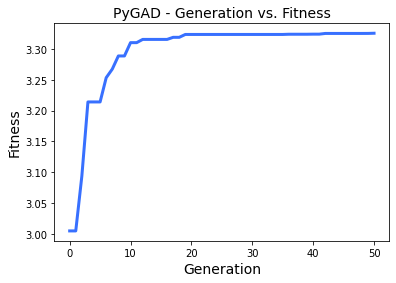

Parameters of the best solution: [0.0010183  0.43766585 0.30345339 0.15208837 0.10577409]
Fitness value of the best solution  3.325427230664574


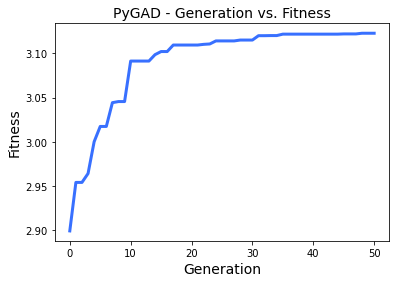

Parameters of the best solution: [0.50894385 0.00239177 0.16816786 0.00489455 0.31560198]
Fitness value of the best solution  3.1226379199984824


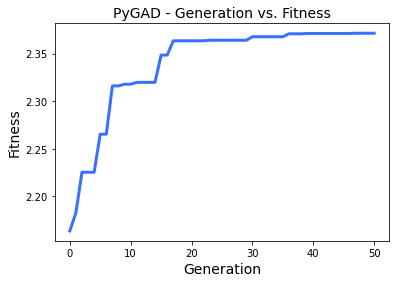

Parameters of the best solution: [3.67011527e-02 3.15367879e-02 9.03166810e-01 3.69699998e-04
 2.82255494e-02]
Fitness value of the best solution  2.3714282257744776


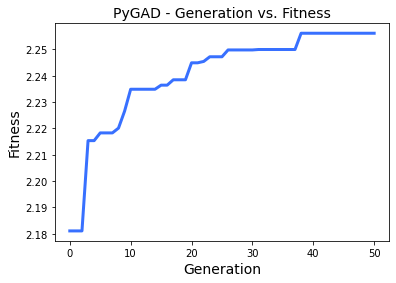

Parameters of the best solution: [9.61857722e-03 1.25775601e-05 2.60250306e-01 5.18698188e-01
 2.11420351e-01]
Fitness value of the best solution  2.25614582773412


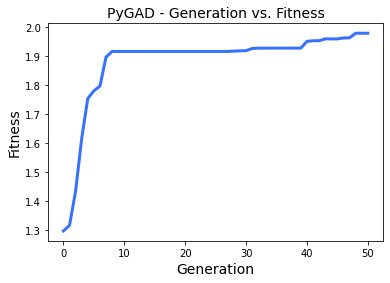

Parameters of the best solution: [0.00830514 0.41491227 0.00413655 0.34720219 0.22544385]
Fitness value of the best solution  1.9794599148347214


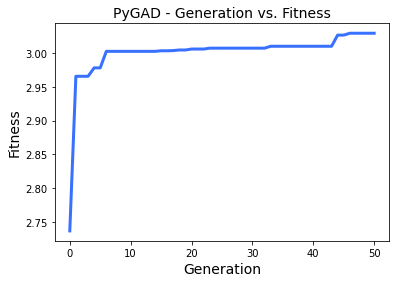

Parameters of the best solution: [0.00217569 0.00472736 0.35947329 0.00814993 0.62547373]
Fitness value of the best solution  3.029522217387875

-------------------------------------------------------------------------------------------------------------------------
      Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2015       0.587251  42.353530     -0.072666      2.204901
2016       0.803309  48.797722     -0.104128      2.388972
2017       0.455998  30.821994     -0.161234      1.490110
2018       0.484911  59.633506     -0.176059      1.753801
2019       0.230714  69.129451     -0.315810      0.849194
2020       0.578511  71.505103     -0.159828      2.145017
Average:  0.5234490251095659 53.706884470227386 -0.16495398039684545 1.8053324181567965 



In [58]:
annual_return_in = []
annual_return_mean = []
std_deviation_in = []
sharpe_ratio_in = []
max_drawdown_in = []

#loop for years
years = []
for x in share_dict:
    arr = share_dict[x]
    df = pd.DataFrame()
    if(len(arr) >= 4):
        years.append(x)
        df[names[arr[0][0]]] = indexes[arr[0][0]]['adjclose'][(indexes[arr[0][0]]['year'] >= x - 3) & (indexes[arr[0][0]]['year'] < x)]
        for i in range(4):
            df[names[arr[i][1]]] = indexes[arr[i][1]]['adjclose'][(indexes[arr[i][1]]['year'] >= x - 3) & (indexes[arr[i][1]]['year'] < x )]
        #df["adjclose"] = df.mean(1)
        df_temp = df
        ga_instance = pygad.GA(num_generations=num_generations,
                       num_parents_mating=num_parents_mating,
                       fitness_func=fitness_function,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       init_range_low=init_range_low,
                       init_range_high=init_range_high,
                       gene_space= [gene_interval, gene_interval, gene_interval, gene_interval, gene_interval],
                       parent_selection_type=parent_selection_type,
                       keep_parents=keep_parents,
                       #on_generation = callback_gen,
                       crossover_type=crossover_type,
                       random_mutation_min_val=0,
                       random_mutation_max_val=1,
                       mutation_by_replacement=True,
                       #mutation_type="random",
                       #mutation_by_replacement=False,
                       mutation_percent_genes=mutation_percent_genes
                       )
        ga_instance.run()
        ga_instance.plot_fitness()
        solution, solution_fitness, solution_idx = ga_instance.best_solution()
        solution = solution / sum(solution)
        print("Parameters of the best solution:", solution)
        print("Fitness value of the best solution ", solution_fitness)
        res = df * solution
        res['Total'] = df.sum(1)
        annual_return, std_deviation, max_drawdown, sharpe_ratio = OneYearCalculator(res['Total'])
        annual_return_in.append(annual_return)
        annual_return_mean.append(annual_return / len(res['Total']))
        std_deviation_in.append(std_deviation)
        sharpe_ratio_in.append(sharpe_ratio)
        max_drawdown_in.append(max_drawdown)

print("\n-------------------------------------------------------------------------------------------------------------------------")
annualReturn = np.array(annual_return_in)
stdDev = np.array(std_deviation_in)
sharpeRatio = np.array(sharpe_ratio_in)
maxDrawdowns = np.array(max_drawdown_in)

frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
result = pd.DataFrame(frame)
result = result.set_index('Date')
print(result)
print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(sharpeRatio), "\n")
          

Below code gives result with swap type mutation

Year: 2015


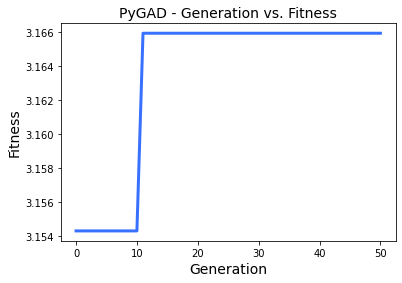

Parameters of the best solution: [0.03555577 0.43040808 0.27468833 0.2087542  0.05059361]
Fitness value of the best solution  3.165949455983274
Year: 2016


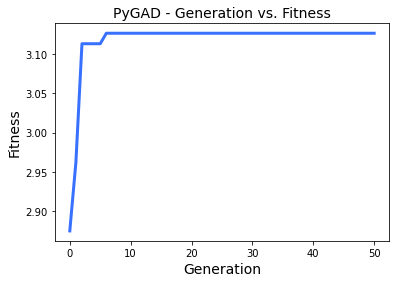

Parameters of the best solution: [0.48080437 0.00083741 0.17487339 0.00083741 0.34264742]
Fitness value of the best solution  3.1266397147902145
Year: 2017


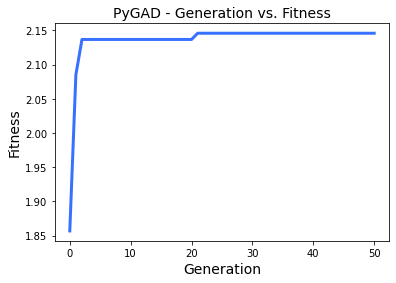

Parameters of the best solution: [0.15403591 0.15896083 0.49177206 0.15896083 0.03627038]
Fitness value of the best solution  2.145855410255324
Year: 2018


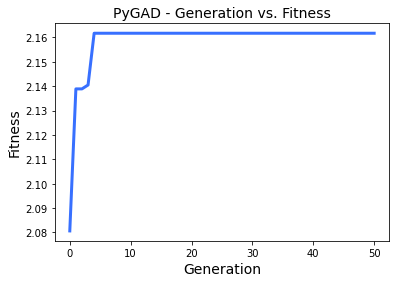

Parameters of the best solution: [0.00811155 0.05710809 0.16197273 0.44430551 0.32850212]
Fitness value of the best solution  2.161700441822443
Year: 2019


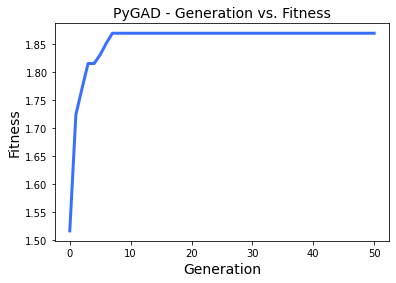

Parameters of the best solution: [0.0198853  0.33118992 0.0198853  0.33118992 0.29784956]
Fitness value of the best solution  1.8688304375410767
Year: 2020


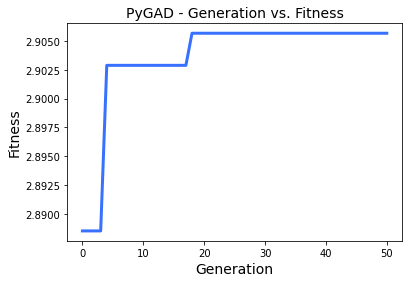

Parameters of the best solution: [0.00535387 0.04694336 0.45513756 0.04694336 0.44562184]
Fitness value of the best solution  2.905660974883446
------------------------------------------

      Annual Return    Std Dev  Max Drawdown  Sharpe Ratio
Date                                                      
2015       0.587251  42.353530     -0.072666      2.204901
2016       0.803309  48.797722     -0.104128      2.388972
2017       0.455998  30.821994     -0.161234      1.490110
2018       0.484911  59.633506     -0.176059      1.753801
2019       0.230714  69.129451     -0.315810      0.849194
2020       0.578511  71.505103     -0.159828      2.145017
Average:  0.5234490251095659 53.706884470227386 -0.16495398039684545 1.8053324181567965 



In [59]:
num_generations = 50
num_parents_mating = 10
sol_per_pop = 20
num_genes = 5
gene_interval = {'low': 0, 'high': 1}
init_range_low = 0
init_range_high = 1
parent_selection_type = "sss"
keep_parents = 5
crossover_type = "single_point"
mutation_type="swap"
mutation_percent_genes = 20

annual_return_in = []
std_deviation_in = []
sharpe_ratio_in = []
max_drawdown_in = []

#loop for years
years = []
for x in share_dict:
    arr = share_dict[x]
    df = pd.DataFrame()
    #val was used for compute prediction
    #val = []
    if(len(arr) >= 4):
        years.append(x)
        print("Year:", x)
        #val.append(indexes[arr[0][0]]['adjclose'][indexes[arr[0][0]]['year'] == x or ['year'] == x - 1 or ['year'] == x - 2][0])
        
        df[names[arr[0][0]]] = indexes[arr[0][0]]['adjclose'][(indexes[arr[0][0]]['year'] >= x - 3) & (indexes[arr[0][0]]['year'] < x)]
        for i in range(4):
            #val.append(indexes[arr[i][1]]['adjclose'][indexes[arr[i][1]]['year'] == x][0])
            #print(names[arr[i][1]])
            df[names[arr[i][1]]] = indexes[arr[i][1]]['adjclose'][(indexes[arr[i][1]]['year'] >= x - 3) & (indexes[arr[i][1]]['year'] < x )]
        df_temp = df 
        ga_instance = pygad.GA(num_generations=num_generations,
                       num_parents_mating=num_parents_mating,
                       fitness_func=fitness_function,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       init_range_low=init_range_low,
                       init_range_high=init_range_high,
                       gene_space= [gene_interval, gene_interval, gene_interval, gene_interval, gene_interval],
                       #on_generation = callback_gen,
                       parent_selection_type=parent_selection_type,
                       keep_parents=keep_parents,
                       crossover_type=crossover_type,
                       random_mutation_min_val=0,
                       random_mutation_max_val=1,
                       # mutation_by_replacement = false An optional bool parameter. It works only when the selected type of mutation is random (mutation_type="random")
                       #mutation_by_replacement=True,
                       mutation_type=mutation_type,
                       mutation_percent_genes=mutation_percent_genes
                       )
        ga_instance.run()
        ga_instance.plot_fitness()
        solution, solution_fitness, solution_idx = ga_instance.best_solution()
        solution = solution / sum(solution)
        print("Parameters of the best solution:", solution)
        print("Fitness value of the best solution ", solution_fitness)
        #prediction = np.sum(np.array(val)*solution)
        #print("Predicted output (example) based on the best solution:", prediction)
        res = df * solution
        res['Total'] = df.sum(1)
        annual_return, std_deviation, max_drawdown, sharpe_ratio = OneYearCalculator(res['Total'])
        annual_return_in.append(annual_return)
        std_deviation_in.append(std_deviation)
        sharpe_ratio_in.append(sharpe_ratio)
        max_drawdown_in.append(max_drawdown)

print("------------------------------------------\n")
annualReturn = np.array(annual_return_in)
stdDev = np.array(std_deviation_in)
sharpeRatio = np.array(sharpe_ratio_in)
maxDrawdowns = np.array(max_drawdown_in)

frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
result = pd.DataFrame(frame)
result = result.set_index('Date')
print(result)
print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(sharpeRatio), "\n")
          

While Swap type mutated genes are still in range 0-1; the replacement with random type mutation is exceeds the limits
With Swap type mutation the results converge faster 

*12th PORTFOLIO*

In this portfolio I created genes with help to a random array that produces 30 values in interval (0-n). Then in the fitness function I sorted that gene array and get 5 most values's indexes. Then I made a binary array to specify that indexes. At the end, by multiplicating the dataframe with this array; shares that corresponds to most valued indexes at the gene selected and used.

In [60]:
# By using genetic algorithm select 5 stocks which are most profitable together (I used sharpe ratio to calculate fitness)
df_temp= pd.DataFrame()

In [61]:
def fitness_func2(solution, solution_idx):
    sorted_indices = np.argsort(solution)
    sorted_indices = sorted_indices[:5]
    sol = np.zeros(30)
    for i in range(len(sorted_indices)):
        sol[sorted_indices[i]] = 1
    df_sol= df_temp * sol
    return sharpeRatioFitFunct(df_sol)

I used random mutation in there

Year: 2015


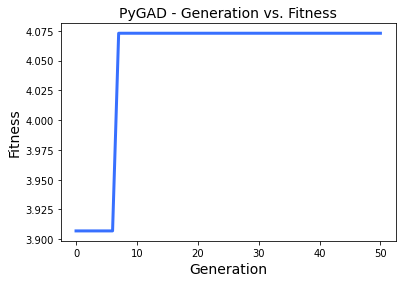

Parameters of the best solution: [22 26 23 11 15  7  2 14  0  2  7  5  5  9 23 25  0 11 27 10 15 28  7 12
 21  0  1 11  0 10]
Fitness value of the best solution  4.072915655829484
Year: 2016


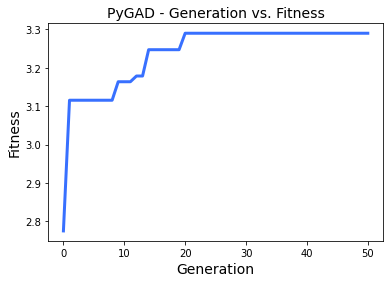

Parameters of the best solution: [12 29 18 23 15 27  7 23  0  7  3 13 15 14 12 16 26 11  2  3 23 15  1 27
 11 24 27 29  0 18]
Fitness value of the best solution  3.2897493574575813
Year: 2017


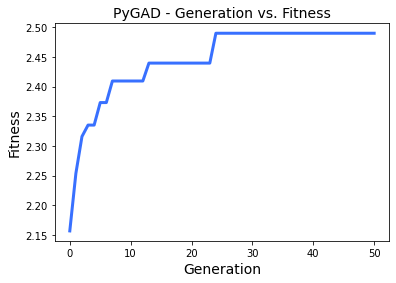

Parameters of the best solution: [ 9  5  2 24 23  1 18 14  3  7 22 20 26 18 29 11  6 12  3 11 16  6  1  5
 23 16 10 17  5 22]
Fitness value of the best solution  2.4896061495870856
Year: 2018


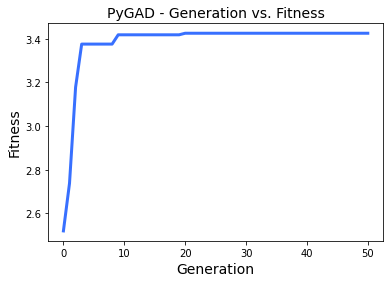

Parameters of the best solution: [15  5 26  2 13  3 18 25  1  5 15 12  9  4 10  1 29  6  0 13 20 23  2 17
 18 18 20 22 28 26]
Fitness value of the best solution  3.4249233216723507
Year: 2019


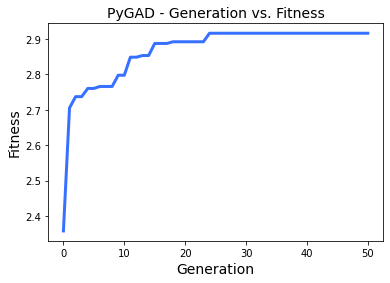

Parameters of the best solution: [19 28 16  0 11  2 10 22  9 15 27 25  8 15  4  1  4  8  7 25 20  5  0 18
 14 29 18  1 22 23]
Fitness value of the best solution  2.9162767466445243
Year: 2020


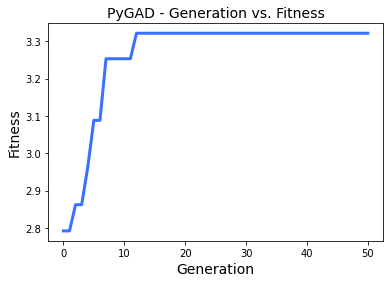

Parameters of the best solution: [11  8  4 15 17  9 22  6 18 12 20 27 26 19 18  0 27  8  1 17 27  8 23  9
 22  3 22  5 13 15]
Fitness value of the best solution  3.3213522224217824
Year: 2021


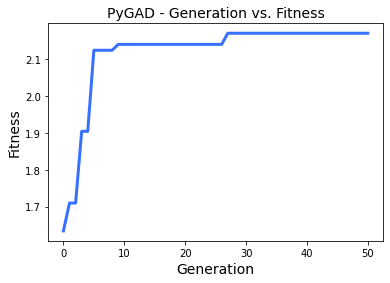

Parameters of the best solution: [15  5  0 28 20  5 10  3 13 26  9 11 29 16 19 17 29  2  2  0  2 16 25 20
 11 22  9  3 14  8]
Fitness value of the best solution  2.171252428833809
------------------------------------------

      Annual Return     Std Dev  Max Drawdown  Sharpe Ratio
Date                                                       
2015       0.728794  276.196404     -0.099159      2.842399
2016       0.525368  233.077040     -0.132736      1.997254
2017       0.340781  166.069562     -0.132736      1.364870
2018       0.528593  331.909855     -0.132736      2.067711
2019       0.483953  484.196891     -0.185120      1.820229
2020       0.571568  388.551365     -0.185120      2.095631
2021       0.341859  307.433174     -0.404227      0.909319
Average:  0.5029881574566543 312.49061307486437 -0.181690480289515 1.871058984905188 



In [62]:
num_generations = 50
num_parents_mating = 10
sol_per_pop = 20
num_genes = 30
init_range_low = 0
init_range_high = 1
parent_selection_type = "sss"
keep_parents = 5
crossover_type = "single_point"
mutation_type="random"
mutation_percent_genes = 20

annual_return_in = []
std_deviation_in = []
sharpe_ratio_in = []
max_drawdown_in = []
#loop for years
years = []
for x in range(2015, 2022):
    years.append(x)
    df= pd.DataFrame()
    print("Year:", x)
    for i in range(len(names)):
        df[names[i]] = indexes[i]['adjclose'][(indexes[i]['year'] >= x - 3) & (indexes[i]['year'] < x)]
    df_temp = df
    n = 30
    ga_instance = pygad.GA(num_generations=num_generations,
                       num_parents_mating=num_parents_mating,
                       fitness_func=fitness_func2,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       init_range_low=init_range_low,
                       init_range_high=init_range_high,
                       gene_space= [range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n), range(0, n)],
                       gene_type = int,
                       parent_selection_type=parent_selection_type,
                       keep_parents=keep_parents,
                       #on_generation=callback_gen,
                       crossover_type=crossover_type,
                       mutation_type=mutation_type,
                       random_mutation_min_val = 0,
                       random_mutation_max_val = 111,
                       mutation_by_replacement=True,
                       mutation_percent_genes=mutation_percent_genes)
    ga_instance.run()
    ga_instance.plot_fitness()
    solution, solution_fitness, solution_idx = ga_instance.best_solution()
    print("Parameters of the best solution:", solution)
    print("Fitness value of the best solution ", solution_fitness)
    res = df * solution
    res['Total'] = df.sum(1)
    annual_return, std_deviation, max_drawdown, sharpe_ratio = OneYearCalculator(res['Total'])
    annual_return_in.append(annual_return)
    std_deviation_in.append(std_deviation)
    sharpe_ratio_in.append(sharpe_ratio)
    max_drawdown_in.append(max_drawdown)

print("------------------------------------------\n")
annualReturn = np.array(annual_return_in)
stdDev = np.array(std_deviation_in)
sharpeRatio = np.array(sharpe_ratio_in)
maxDrawdowns = np.array(max_drawdown_in)

frame = { 'Annual Return': annualReturn, 'Std Dev': stdDev, 'Max Drawdown': maxDrawdowns, 'Sharpe Ratio': sharpeRatio, 'Date': years}
result = pd.DataFrame(frame)
result = result.set_index('Date')
print(result)
print("Average: ", np.mean(annualReturn), np.mean(stdDev), np.mean(maxDrawdowns), np.mean(sharpeRatio), "\n")
          